# Text analysis of grants funded by the U.S. National Science Foundation
<p><em>Prepared by Geovanna Meier</em></p>
<p></p>

<p>One of the biggest concerns for private individuals, researches, and non-profit organizations is to get funding to continue and expand their work. Although there are many options to obtain funding and organizations rarely depend on just one source, government grants provide one of the best alternatives to finance research and projects with a socio-economic impact.</p>

<p>Since grants funded by the U.S. government are one of the most common sources of funding and preparing a proposal can be a daunting process, knowing the project topics that get the most funding and the terms that are most likely related to greater financial support, can help individuals and organizations find the best ways to submit their plans based on theme, length, and amount of money needed.</p>

<p>Hence, the goal of this project is to use publicly available award data from the U.S. National Science Foundation (NSF) to identify whether the type of language used and linguistic patterns have have an impact on the aid received. The analysis considers the length of the abstract, ease of read and other linguistic patterns as predictors and the results can help future applicants understand how their linguistic patterns can impact the funding received based on theme, length,number of words and proportion of adverbs used.</p>


#### Data Sources:
* [National Science Foundation awards](https://www.nsf.gov/awardsearch/download.jsp)
* [Congress Reduces NSF Budget to US $5.47 Billion](https://www.nsf.gov/about/congress/108/highlights/cu04_1123.jsp)
***
<p><b><em>Skills:</em></b> Exploratory Data Analysis, Text Analysis, Natural Language Processing, Inferential Statistics, Machine Learning.</p>
<p><b><em>Libraries:</em></b> Pandas, NumPy, Matplotlib, Seaborn, LDA, NLTK, SpaCy, Gensim, Scikit-learn, Bokeh.</p>

# Set up the environment

In [1]:
# pretty print all cell's output and not just the last one
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [2]:
# set filterwarnings to 'once' to show warnings only the first time code is run
import warnings
warnings.filterwarnings('ignore')

In [3]:
# import modules
import os
import sys
from pathlib import Path

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import bokeh
from bokeh.io import output_notebook, output_file, show, export_png

# set path to save data, save images, retrieve code
data_path = Path("../data/")
img_path = Path("../reports/figures/")
src_path = os.path.join('../src/')

In [4]:
# once it is installed, you'll just need this in future notebooks:
%load_ext watermark
%watermark -a "Geovanna Meier" -d -t -v -p numpy,pandas

Geovanna Meier 2019-07-04 15:31:34 

CPython 3.7.3
IPython 7.6.0

numpy 1.16.4
pandas 0.24.2


In [5]:
# set wider prints for pandas
pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows', 500)

# set displaying options for pandas
pd.options.display.max_colwidth = 200
pd.options.display.float_format = '{:.2f}'.format

# set displaying options for plots with sns and plt
_=plt.rcParams['figure.figsize'] = [14,6]
_=plt.style.use(['fivethirtyeight'])

# set overall parameters for plots
_=plt.rcParams['xtick.labelsize']=15
_=plt.rcParams['ytick.labelsize']=15
_=sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
_=sns.set_style(style = 'dark')

# 'double resolution plot output for Retina screens'
%config InlineBackend.figure_format = 'retina'

In [6]:
# add the src directory as one where we can import modules from
sys.path.append(src_path)

In [7]:
# load autoreload to load custom modules 
%load_ext autoreload
%autoreload 1

# U.S. National Science Foundation (NSF) Awards Data

## Text data from award abstracts

<p>The data come from grants and project proposals funded by the NSF from 2000 to 2018. The original dataset contained on over 167,000 active and expired awards and provided information on the amount awarded, the internal division (directorate) that awarded the funds, the abstract of the proposal, and the start and end dates of the funding among other details.</p>

<p>The data was downloaded manually directly from the <a href ="https://www.nsf.gov/awardsearch/download.jsp"> National Science Foundation awards site </a> in XML format by fiscal year, as downloads are limited to 3000 records.</p>

In [8]:
# use aimport to look for 'custom' modules in features dir.
%aimport features.build_features
from features.build_features import cleanDataPhaseI

## Data Cleaning Phase I

<p>Since the objective of this project is to analyze the relationship between grant abstracts and the amount of money awarded, the first step is to remove records with missing records for the <em>'Abstract narration'</em> and <em>'award amount'</em> attributes. </p>

<p>A quick look at the number of records on each attribute showed that the <em>'AwardTotalIntnAmount'</em> and <em>'Name.1'</em> features have over 50% of missing data. Since the information provided by these two variables does not provide new information, as they are subcategories of award amount and applicant's name respectively, they were removed from the analysis.</p>

In [9]:
%%time
# bring the raw data and create a copy to work with
snf_data, snf = cleanDataPhaseI(data_path /'raw/snf_data.csv')


There are 167,542 grant abstracts in the dataset


After initial cleaning, there are:  164,484 grant abstracts in the dataset

CPU times: user 38 s, sys: 524 ms, total: 38.5 s
Wall time: 38.6 s


In [10]:
# explore the data and confirm it was loaded
snf.head(1)

,AbstractNarration,AwardAmount,AwardEffectiveDate,AwardExpirationDate,AwardTitle,CityName,CountryName,Institution,NSF_org,LongName.1,Name,SignBlockName,StateCode,StateName,Value,ZipCode,year
AwardID,,,,,,,,,,,,,,,,,
1835704,This award supports the design and implementation of a software framework to simulate the movement of water at various scales. Understanding the movement and availability of water locally and acro...,700000,10-01-2018,09-30-2022,Collaborative Research: Framework: Software: NSCI : Computational and data innovation implementing a national community hydrologic modeling framework for scientific discovery,Boise,United States,\n,Directorate for Computer & Information Science & Engineering,Office of Advanced Cyberinfrastructure (OAC),Boise State University,Stefan Robila,ID,Idaho,Standard Grant,837250001,2018


### Considering only external funding

The NFS offers financial aid to various types of projects and applicants, including other government agencies. This analysis focuses only on funding provided to external individuals. Hence, awards granted to intergovernmental Personnel Awards, BOA/Task Orders, and Interagency Agreements were removed.

## Summary Statistics

In [11]:
# Descriptive statistics
snf.describe()

,AwardAmount
count,164484.00
mean,454151.92
std,2854378.97
min,579.00
25%,100000.00
50%,245000.00
75%,426000.00
max,372455040.00


After removing missing values and awards granted to other agencies, the data set contained 164,485 grants with effective dates that range from 2000 to 2018. The maximum aid awarded was over 1 billion dollars and the minimum was $\$579$, with 50\% of the grants receiving over $\$245,000$.
This one billion dollar grant is certainly skewing the data, hence a log transformed was applied to analyze the distribution of the awards.

### Distribution of awards

<p>A histogram shows how the one billion dollar award is skewing the data.</p>

In [12]:
from visualization.visualize import plot_hist

Loading BokehJS ...

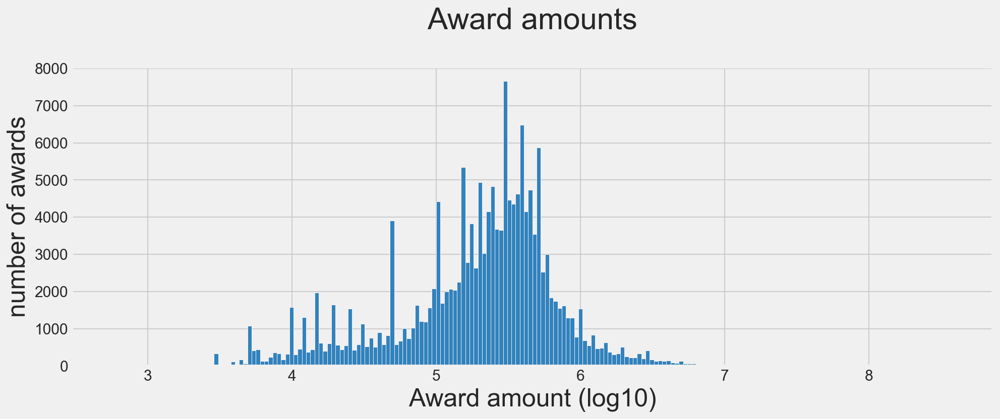

CPU times: user 1.61 s, sys: 108 ms, total: 1.72 s
Wall time: 1.11 s


In [13]:
%%time
plot_hist(snf, colname = 'AwardAmount', prefix='awardamount')

### Out of the ordinary
The summary statistics along with the histogram of the distribution of award amount, shows that Award amounts are not normally distributed, with some projects receiving over a billion dollars, creating a huge gap between the maximum amount awarded to a grant and the median. Further investigation shows that the maximum amount awarded was for a project that lasted over 11 years. Hence, in order to make a fair comparison between grants, we'll control for duration by adding a new attribute that considers both the length and the amount awarded.

$$\frac{AwardExpirationDate-AwardEffectiveDate }{AwardAmount}$$

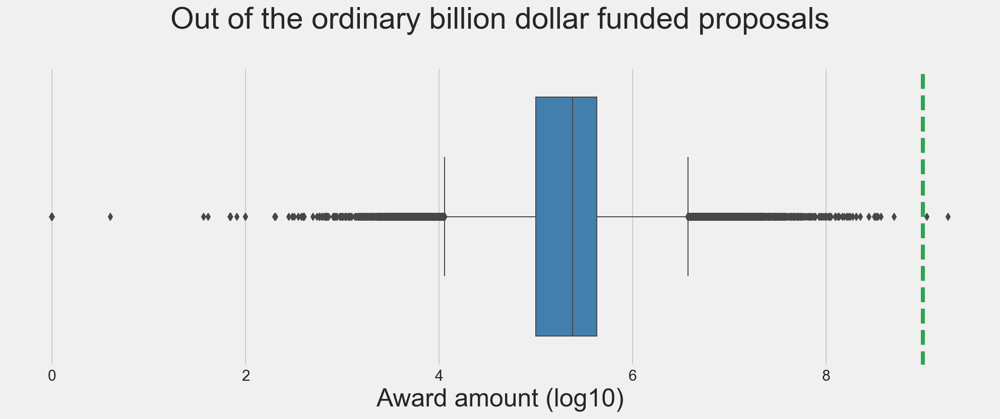

CPU times: user 850 ms, sys: 60.6 ms, total: 911 ms
Wall time: 598 ms


In [14]:
%%time
from visualization.visualize import plot_boxplot
plot_boxplot(snf_data, 
             'AwardAmount',title = 'Out of the ordinary billion dollar funded proposals\n',
             vertical_line=9)

Since this billion dollar award is not a common occurrence, in fact in only happened once between 2000-2018, the record was removed to consider only records that are representative of the entire population.

## Funding has improved over time

One of the assumptions of the analysis is that funding for grants and projects has increased over the years. As awareness of government funding for research and projects for social good increase, more organizations, educational institutions and researches apply for funding. 

In [15]:
# import bokeh modules
from bokeh.io import output_notebook, output_file, show, export_png
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, Range1d, DataRange1d, Plot, CategoricalColorMapper, LabelSet, BoxAnnotation
from bokeh.models.tools import HoverTool
from bokeh.models.glyphs import Circle, Text
from bokeh.palettes import Spectral5
from bokeh.transform import factor_cmap
from bokeh.models.annotations import Label
from bokeh.io import export_svgs

output_notebook()

Loading BokehJS ...

In [16]:
%reload_ext autoreload
from visualization.visualize import plot_fundingOvertime, plot_projectsOverTime, plot_awardsPerDivision

In [17]:
plot_fundingOvertime(snf, 'year', 'AwardAmount', left=2015, right=2016.5)


*** INTERACTIVE MODE: HOVER OVER THE GRAPH TO SEE AWARD TOTALS FOR EACH YEAR***


###### change to code cell when running in interactive mode outside github

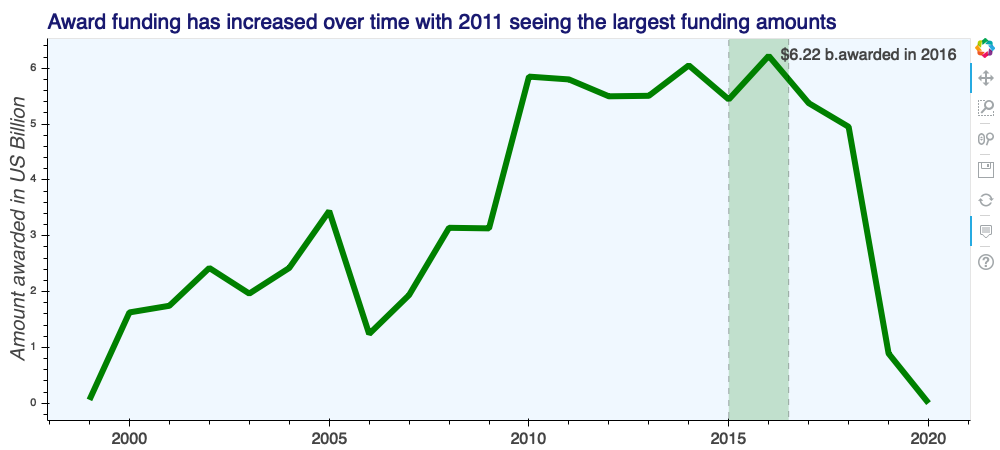

In [20]:
from IPython.core.display import Image, display
display(Image(filename="../reports/figures/fundingovertime.png"))

<p>The trending line in the plot above shows how award funding has increased overtime, with the largest funded projects being awarded in 2016.</p>
<p>The decline in 2006 could be explain by the budget cut suffered by the NSF for Fiscal year 2005 as it had to 'operate at 1.9% below FY 04 spending levels... affecting research directorates and programs'(NSF, 2004). </p>
<p>Budget in the next fiscal year came back to normal levels, which is seen by the renewed increased in projects funded.</p>

## Number of funded projects have also increased

<p>Although the number of funding improved overtime, it didn't necessarily mean that the number of projects increased, as some project may receive more or less funding. A trend line of the number of projects, however, indicated that in fact the number of project also increased.</p>

In [21]:
plot_projectsOverTime(snf, col='year', column_line='AbstractNarration',operation='count')


*** INTERACTIVE MODE: HOVER OVER THE GRAPH TO SEE COUNTS FOR EACH YEAR***


##### change cell type to code and comment when running notebook on interactive mode outside github

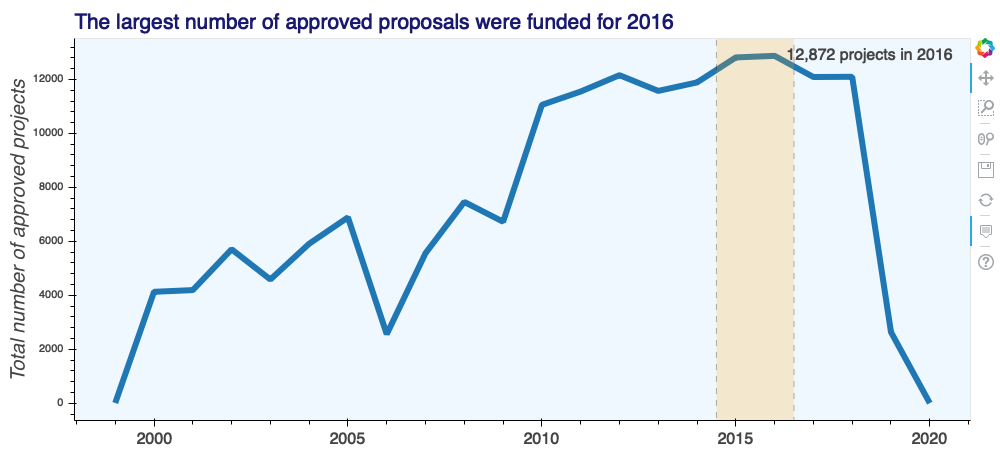

In [22]:
from IPython.core.display import Image, display
display(Image(filename="../reports/figures/projectsovertime.png"))

The number of project funded each year has increased from 9 projects in 1999 to over 12,000 in 2016, with a sharp decline in 2006,  which coincides with the trend shown by the amount awarded.

## Funding comes from different sources
<p>The NSF provides research and project funding 'for all fields of fundamental science and engineering, except for medical sciences' (NSF) through its directorates.</p> 
<p>Each directorate has an area of specialization, which will support specific areas of research. The first step in understanding funding patterns is to understand how many unique directorates there are and group similar specializations if necessary.</p>

### Which directorate funds more awards and which one provides more financial support?
One of the assumptions of the project is that the directorates of Biological Sciences and Social, Behavioral & Economic Sciences would have the largest number of funded projects as they involve biological, molecular and economic research.

In [23]:
plot_awardsPerDivision(snf, 
                       NSF_org='NSF_org',
                       aggregate = list(['count','max', 'mean', 'median']), 
                       sortby=('AwardAmount', 'count'), n_directs = 5, 
                       title = 'Directorate for For Mathematical & Physical Scien has funded the largest number of projects')

                                                        NSF_org  count  \
0              Directorate for Mathematical & Physical Sciences  34118   
1                                   Directorate for Engineering  31513   
2  Directorate for Computer & Information Science & Engineering  24543   
3                                  Directorate for Geosciencess  24202   
4                           Directorate For Biological Sciences  18046   

         max      mean    median  
0  372455040 466012.57 253945.50  
1   46379948 319872.46 225000.00  
2  226551969 458891.23 300000.00  
3  321644885 514315.73 228541.00  
4  331228541 501120.08 310803.00  


##### change cell type to code and comment when running notebook on interactive mode outside github

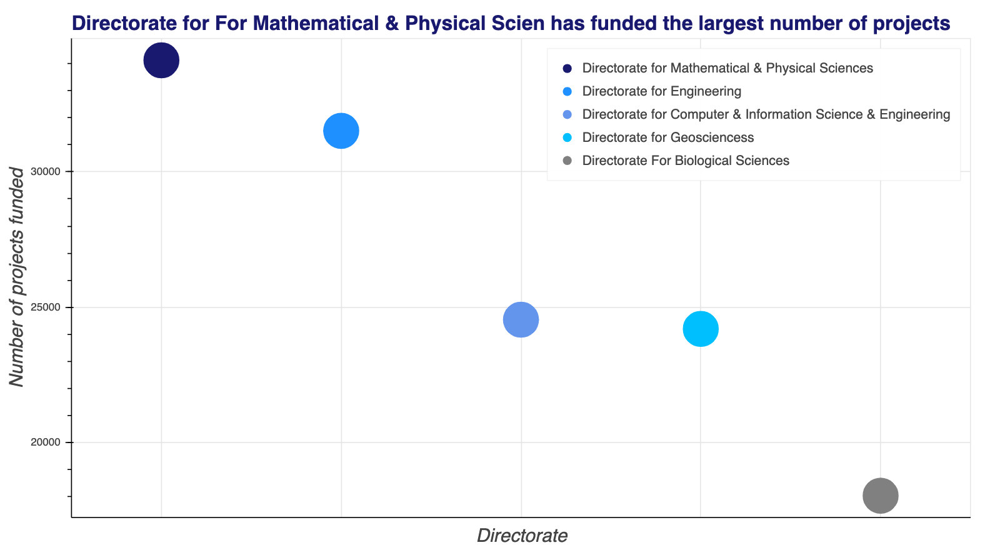

In [24]:
from IPython.core.display import Image, display
display(Image(filename="../reports/figures/awardsperdir.png"))

<p>From 2000 to 2018, the directorate for Mathematical and Physical Science had the largest number of funded projects with 34,118 projects, averaging $\$466,012.57$ per proposal.</p> 
<p>The Engineering division had the second largest number of funded projects, 31,513, awarding on average $\$319,872.46$ per proposal.<p/> 
<p>It is followed by the Computer and Information Science and Engineering with 24,543 awarded projects, averaging $\$458,891.23$. The Geosciences division with 24,202 funded projects, and Biological Sciences with 18046 projects.</p>

# -----------------------------------

## Data cleaning phase II - Text analysis

### Considering grant duration for award amount
<p>As previously discussed, award amounts are not normally distributed. One of the reasons is that while some projects span several years and receive their funding in installments, others receive their award as a lump sum. Hence, the effective and expiration date of the latter are recorded as the same date.</p>

<p>Therefore, in order to control for the range in project durations, the span between the effective and expiration date will be used to consider the amount awarded. This will consider the daily funding.</p>

<p>The second cleaning phase of the dataset focuses on the the proposal abstracts and controlling for award amounts based on duration. </p>
<p>The first part creates a new feature with the duration of each proposal in days and hard codes proposals that have the same effective and expiration date as having a one day duration.</p>

<p>An analysis of the descriptive statistics showed there were some errors in the dates. 17 proposals had an effective date that was after the expiration date, giving negative amounts for the awarded amount.

<p>Since the awarded amount cannot be negative and there is no further information to manually fix the 'errors', the records were removed.</p>

In [20]:
%aimport features.build_features
from features.build_features import cleanDataPhaseII, semmantics, grammar_info, get_grammar

In [21]:
snf= cleanDataPhaseII(snf)

In [22]:
snf.head(1)

,AbstractNarration,AwardAmount,AwardEffectiveDate,AwardExpirationDate,AwardTitle,CityName,CountryName,Institution,NSF_org,LongName.1,Name,SignBlockName,StateCode,StateName,Value,ZipCode,year,grant_duration,amount_awarded_per_day
AwardID,,,,,,,,,,,,,,,,,,,
1835704,This award supports the design and implementation of a software framework to simulate the movement of water at various scales. Understanding the movement and availability of water locally and acro...,700000,10-01-2018,09-30-2022,Collaborative Research: Framework: Software: NSCI : Computational and data innovation implementing a national community hydrologic modeling framework for scientific discovery,Boise,United States,\n,Directorate for Computer & Information Science & Engineering,Office of Advanced Cyberinfrastructure (OAC),Boise State University,Stefan Robila,ID,Idaho,Standard Grant,837250001,2018,1460,479.45


### Semantics and readability

<p>One of the hypothesis of this project is that linguistic patterns affect the amount of money awarded. In order to obtain the attributes to create the predictive model, a text analysis of the abstract was done using NLTK, SpaCy and LDA.</p>

<p>The first step was to use both NLTK and spaCy to extract linguistic patterns, semantics, and distinct language elements that help identify
    <ul>
    <li>the applicant's writing style: length of abstract</li>
    <li>content accessibility: flesch reading ease score, average words per sentence, lexical diversity</li>
    <li>assertiveness: number of adverbs used, number of unique words</li>
    <li>clarity: average word length, flesch reading ease score</li>
   </ul>
</p>

<p>The flesch reading ease score measures the clarity and ease of read of a text. A lower the score, means that the text is more difficult to read. </p> Therefore, even though proposals are reviewed by subject matter experts, the hypothesis is that abstracts that are easy to understand will be more appealing to the reviewers as they will have to spend less time trying to understand the point of the writer or the project</p> 

    
| Score       | Description                                         |
| ----------- | ----------------------------------------------------|
| 90 – 100    | easily understood by an average 11-year old student |
| 60 – 70     | easily understood by 13-15-year-old students        |
| 0 – 30      | best understood by university graduates             |

<p>

In [23]:
from features.build_features import get_grammar

In [24]:
snf= get_grammar(snf)

In [25]:
snf['abstract_length'] = [len(x) for x in snf['clean_abstract']]

In [26]:
snf.head(1)

,AbstractNarration,AwardAmount,AwardEffectiveDate,AwardExpirationDate,AwardTitle,CityName,CountryName,Institution,NSF_org,LongName.1,Name,SignBlockName,StateCode,StateName,Value,ZipCode,year,grant_duration,amount_awarded_per_day,clean_abstract,flesch_score,sentence_count,word_count,avg_word_len,unique_words,avg_words_per_sent,lexical_diversity,abstract_length
AwardID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1835704,This award supports the design and implementation of a software framework to simulate the movement of water at various scales. Understanding the movement and availability of water locally and acro...,700000,10-01-2018,09-30-2022,Collaborative Research: Framework: Software: NSCI : Computational and data innovation implementing a national community hydrologic modeling framework for scientific discovery,Boise,United States,\n,Directorate for Computer & Information Science & Engineering,Office of Advanced Cyberinfrastructure (OAC),Boise State University,Stefan Robila,ID,Idaho,Standard Grant,837250001,2018,1460,479.45,this award supports the design and implementation of a software framework to simulate the movement of water at various scales understanding the movement and availability of water locally and acros...,7.59,18,533,6,271,29.61,0.51,3786


In [27]:
snf.to_csv(data_path /'processed/snf.csv', index_label='AwardID', index = True)

## Text analysis summary statistics

<p><b>words</b></p>
<p>The word count for each abstract included only the number of words without punctuation. On average, abstracts had 334 words with a standard deviation of 132 words and 80% of abstracts having 450 words or less.</p>

<p><b>abstract length</b></p>
<p>Since abstracts are only submitted once a proposal is being considered to receive funding, the average length shows abstracts are about 30 lines of text, which coincides with the maximum number of lines for project abstracts for the National Institutes of Health, another U.S. government agency which provides vast biomedical funding. Hence, abstracts seem to be in line with other government standards.
</p>

<p><b>unique words</b></p>
<p>The average number of unique words per abstract is 179 words with a standard deviation of 56 words. This shows that in general abstracts tend to avoid redundancy.</p>

<p><b>words per sentence</b></p>
<p>Easy to understand sentences have in general between 15 - 20 words. More than that and the reader tends to get lost. The average number of sentences per abstract in this data set is 30 words, making sentences longer than average and harder to understand.</p>

<p>Even though many of the reviewers are subject matter experts, several studies have shown that sentences with '29 words or longer are very difficult to understand' (GovUK). This not only hurts comprehension, but it slows down the review process.</p>

<p><b>word length</b></p>
<p>The average word length per abstract is five words, indicating applicants favor common and less complex words, even when they use more words per sentence. The word length for 75% of the abstracts is 6 words, which is in line with the average length of common words.</p>

<p><b>flesch reading ease score</b></p>
<p>The plots for the abstracts' flesch score showed that that the majority of the abstracts are written for at the graduate level and intended for subject expert matters. 75% of the abstracts have a score of 19 or less. </p>

In [28]:
# load autoreload to load custom modules 
%reload_ext autoreload
%autoreload 1

# use aimport to look for 'custom' modules in features dir.
%aimport visualization.visualize
from visualization.visualize import plot_fleschScore

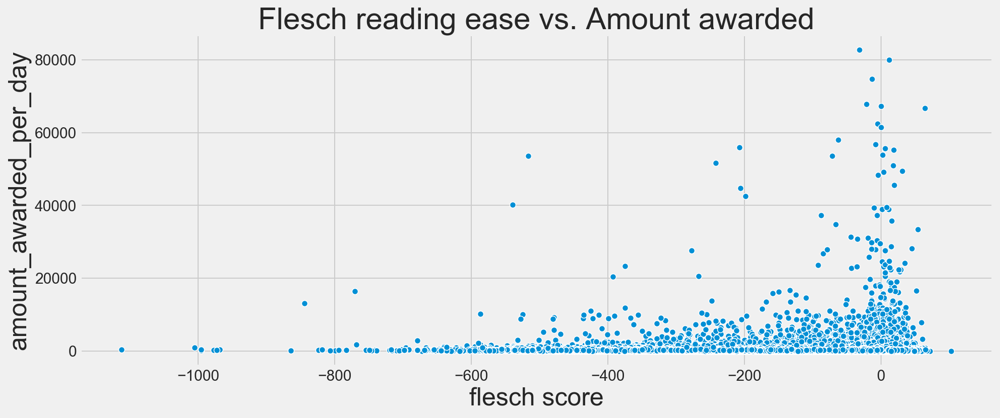

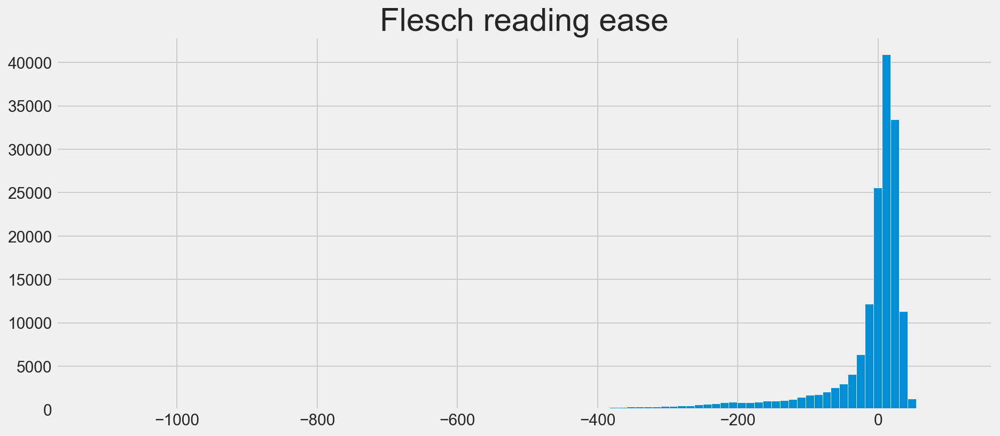

In [29]:
plot_fleschScore(snf, bins=100)

In [30]:
snf['flesch_score'].describe()

count   164243.00
mean       -22.99
std         87.78
min      -1112.03
25%        -16.34
50%          7.08
75%         19.10
max        102.61
Name: flesch_score, dtype: float64

In [31]:
from visualization.visualize import plot_hist

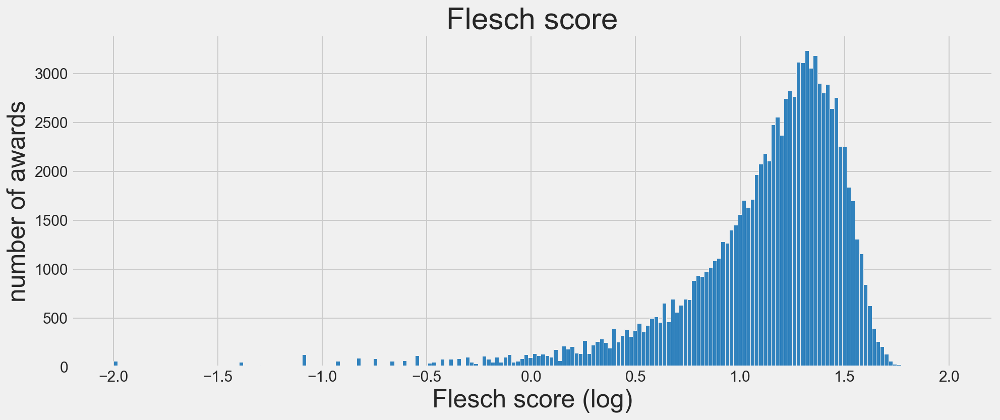

In [32]:
plot_hist(df=snf,colname='flesch_score', prefix='fleschscore', title='Flesch score', xlabel='Flesch score (log)')

#### Total words vs. unique words

<p>Since the summary statistics showed that on average abstracts tend to avoid redundancy, a graph comparing the count of unique words vs total number of words per abstract will let us know the overall word distribution.</p>
<p>Although the relationship is not completely linear, the plot shows that in general as the number of words increases, the award amount increases slightly.</p>

In [33]:
from visualization.visualize import plot_wordsAwards

In [34]:
plot_wordsAwards(snf,'amount_awarded_per_day',
                     'word_count',
                     y_axis_type='log',
                     title= 'Funding vs Number of words used in the abstract')

##### change cell type to code and comment when running notebook on interactive mode outside github

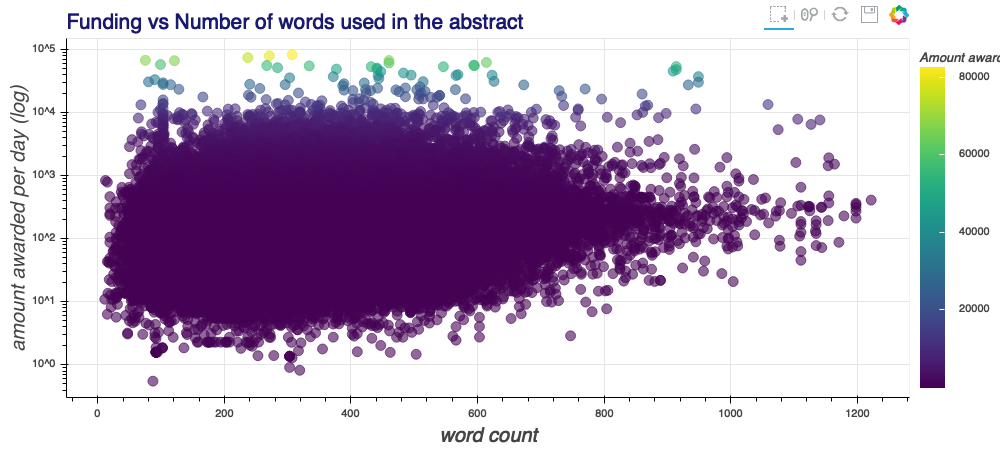

In [25]:
from IPython.core.display import Image, display
display(Image(filename="../reports/figures/wordawards.png"))

In [35]:
# subset the word count
%time
from bokeh.layouts import gridplot

def plot_compareWordCounts(word_count, unique_words):
    
    wuc = snf.groupby('word_count').size().reset_index()
    wc = snf.groupby('unique_words').size().reset_index()
    wuc.rename(columns = {0:'count'}, inplace = True)
    wc.rename(columns = {0:'count_unique'}, inplace = True)
    
    # initialize the figure
    p = figure(plot_width = 400, 
           plot_height = 300, 
           tools = 'wheel_zoom, pan, box_select,save, reset')

    p1=p.circle(x = wuc['word_count'], y = wuc['count'])
    p2=p.circle(x = wc['unique_words'], y = wc['count_unique'])
    
    plot_options = dict(plot_width = 800, plot_height = 450,
                    tools = 'wheel_zoom, pan, box_select,save, reset,lasso_select,help')

    # create a new plot
    s1 = figure(**plot_options)
    s1.title.text = 'number of words per abstract'
    s1.title.text_font_size = "16pt"
    s1.circle(x = wuc['word_count'], y = wuc['count'], size=4, color='DodgerBlue')
    s1.xaxis.axis_label_text_font_size = '15pt'
    s1.yaxis.axis_label_text_font_size = '15pt'
    s1.xaxis.axis_label = 'word count'
    s1.yaxis.axis_label = 'Number of proposals'

    # create a new plot and share both ranges
    s2 = figure(x_range=s1.x_range, 
            y_range=s1.y_range, 
            **plot_options)
    s2.title.text = 'number of UNIQUE words per abstract'
    s2.title.text_font_size = "18pt"
    s2.circle(x = wc['unique_words'], 
          y = wc['count_unique'], 
          size=4, color='CornflowerBlue')
    s2.xaxis.axis_label_text_font_size = '15pt'
    s2.yaxis.axis_label_text_font_size = '15pt'
    s2.xaxis.axis_label = ' unique word count'

    p = gridplot([[s1, s2]])
    
    # export plots
    _=export_png(p, filename = img_path / 'wordcountcomparison.png')
    output_file(img_path/'wordcountcomparison.html')
    
    #p.output_backend = "svg"
    #export_svgs(p, filename=img_path/"wordcountcomparison.svg")
    
    show(p)

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 6.91 µs


In [36]:
plot_compareWordCounts(word_count='word_count',unique_words='unique_words')

##### change cell type to code and comment when running notebook on interactive mode outside github

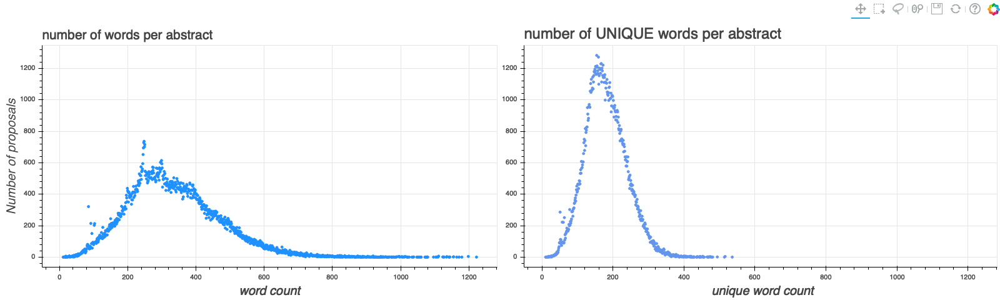

In [26]:
from IPython.core.display import Image, display
display(Image(filename="../reports/figures/wordcountcomparison.png"))

The plots shows that while the number of words per abstract is fairly skewed with several abstracts having over 800 words, in general, the number of proposals with unique words is fairly normally distributed with most of proposals  having ~179 unique words. 

#### Length of the abstract

<p>The length of the abstract, which considers all characters not just words, tells us how lengthy the project descriptions are and whether this can have an impact on the aid received.
</p>
<p>The scatter plot shows that as the length increases, the award amount tends to increase. This would suggest that in general, longer proposals with more distinct words tend to obtain more funding than shorter ones. A possible reason is that detailed proposals that use clear and unique words are perceived as having a clearer and specific idea on why the project is important and how the funds will be used.</p> 

In [37]:
from visualization.visualize import plot_scatter, uniqueFunding, ecdf_words

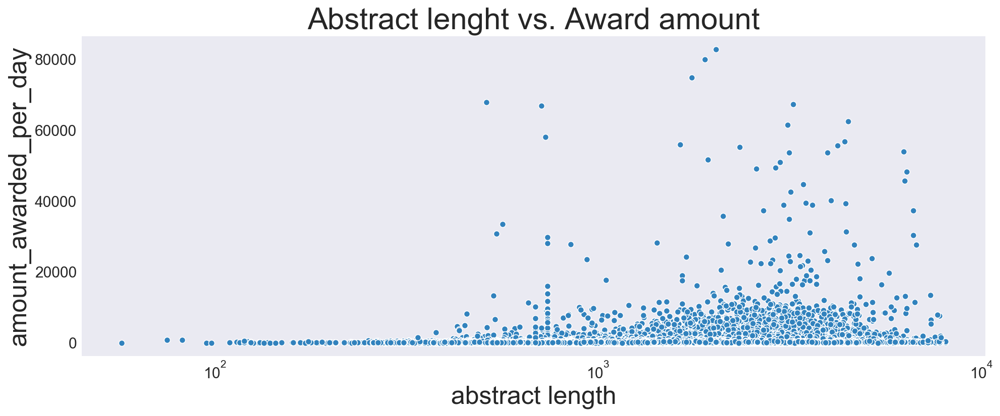

In [38]:
plot_scatter(x="abstract_length", 
             y="amount_awarded_per_day", 
             data=snf, 
             title='Abstract lenght vs. Award amount',
            scale='log',
             xlabel = 'abstract length', 
             ylabel = 'amount_awarded_per_day', 
             prefix='abstractlength')

In [39]:
uniqueFunding(snf)

As mentioned in previously, the scatter plot shows that a greater number of unique words in the abstract is related to more funds.

### Empirical Cumulative Distribution Function

A visual representation of the ECDF for total words used vs. unique words shows that 80% of abstracts use at least 200 unique words.

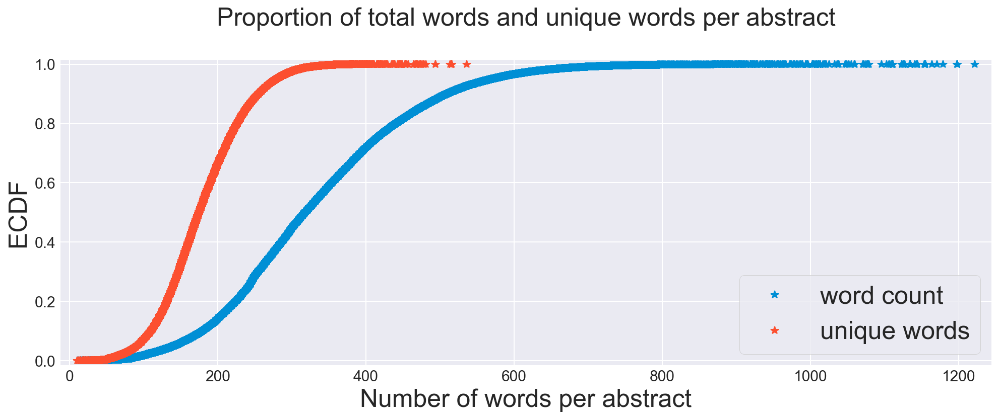

In [40]:
ecdf_words(snf)

## Create feature for the gender of program officer

<p>One of the hypothesis is that gender may have an effect on the amount of money received by a grant. Since the only thing we have is the name of the program officer who approved the grant proposal, we use the first name to predict the gender and then use this attribute in the final model.</p>
<p>Although not perfect, this can give us an insight on the grant proposal and approval process.</p>

<p>Two different models were tried to predict gender. The first model used a NLTK's naïve bayes classifier and a list of 8000 names available to nltk.corpus.</p>

<p>The second model was done using sckit-learn naïve bayes classifier.</p>

<p>The NLTK classifier, which obtained a higher predictive accuracy with 76%, was used to create the gender attribute used for the award amount predictive model.</p>

In [41]:
# load autoreload to load custom modules 
%reload_ext autoreload
%autoreload 1

# use aimport to look for 'custom' modules in features dir.
%aimport features.build_features
from features.build_features import gender_classifier, gender_identification, gender_sklearn, get_signer_name

In [42]:
# nltk naive bayes classifier
gender_classifier('Ana')

'female'

In [43]:
# sckit-learn naive bayes classifier
gender_sklearn('Anna')

Accuracy on unseen data: 0.6424974823766365
The model estimates that Anna is a ['female'] name


## Add Gender Attribute

In [44]:
%%time
## APPLY FUNCTION TO GET GENDER
snf['predGender_po'] = snf['SignBlockName'].apply(get_signer_name)

CPU times: user 2h 22min 32s, sys: 22.7 s, total: 2h 22min 55s
Wall time: 2h 22min 59s


In [45]:
#run
snf.to_csv(data_path /'processed/snf.csv', index_label='AwardID', index = True)

<p>Once reviewers have evaluated proposals, the NSF program officer for each division reviews the proposal and makes the decision to award or deny funding. One of the questions of the project is whether gender has an effect on the number of proposals approved and the amount of money awarded.</p>
 
<p>Since the data provides information on the name of the NSF program officer who signed the approved proposal, a model was created to predict the gender of all program officers. Two models were tried, an NLTK classifier which used a list of 8000 common male and female names; and a naïve bayes model.</p>
 
<p>Since the accuracy of the NLTK classifier was  77% compared to just 66% for the naïves bayes, this model was used for the entire dataset to create a new attribute that would be used in predicting the award amount.</p>
 
<p>One of the hypothesis is that gender may have an effect on the amount of money received by a grant. Since the only thing we have is the name of the person who signed the grant proposal, we use the first name to predict the gender and then use this attribute in the final model. Although not perfect, this can give us an insight on the grant proposal and approval process.</p>
 
<p>Based on the predictive model, the number of male program officers reviewing proposals outnumber women throughout the years. Although this is by no means a perfect measure of the number of women per department, it shows that there is a greater number of male reviewers. </p>

### Visualizing gender distribution of program officers over the years

In [46]:
%reload_ext autoreload
%autoreload 1
from visualization.visualize import plot_genderDist

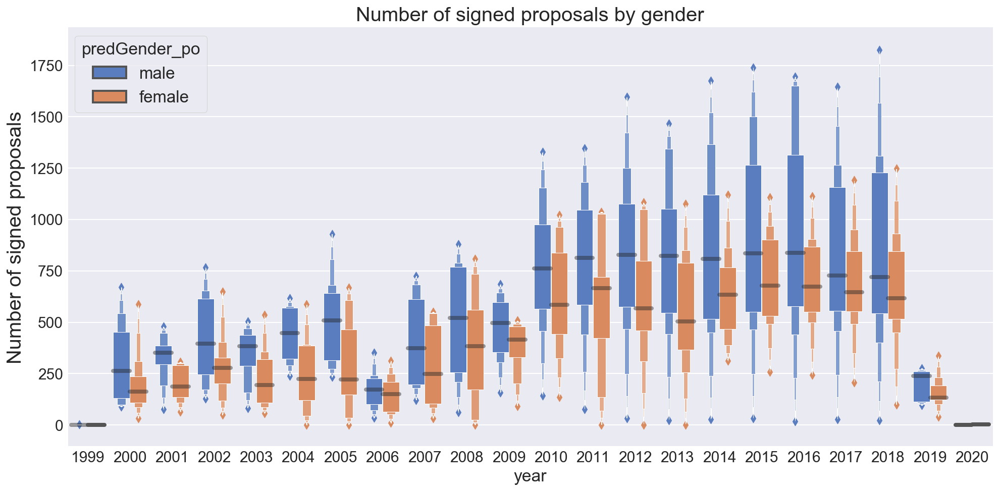

In [47]:
plot_genderDist(df = snf)

In [48]:
snf.describe()

,AwardAmount,grant_duration,amount_awarded_per_day,flesch_score,sentence_count,word_count,avg_word_len,unique_words,avg_words_per_sent,lexical_diversity,abstract_length
count,164243.00,164243.00,164243.00,164243.00,164243.00,164243.00,164243.00,164243.00,164243.00,164243.00,164243.00
mean,444803.48,1180.17,334.24,-22.99,11.80,333.67,5.39,179.15,29.48,0.56,2305.85
std,2282003.08,551.42,1029.28,87.78,5.05,132.49,0.51,57.24,8.55,0.07,909.07
min,579.00,1.00,0.55,-1112.03,1.00,11.00,4.00,10.00,7.50,0.22,57.00
25%,100000.00,730.00,109.59,-16.34,8.00,241.00,5.00,140.00,24.60,0.51,1672.00
50%,245453.00,1095.00,208.63,7.08,11.00,318.00,5.00,175.00,28.25,0.55,2199.00
75%,426354.50,1460.00,342.17,19.10,15.00,413.00,6.00,216.00,32.73,0.60,2861.00
max,277145487.00,4900.00,82753.05,102.61,54.00,1222.00,12.00,536.00,580.00,1.00,8061.00


## NLP ABSTRACT

The next step is to use latent Dirichlet allocation (LDA) to obtain semantics and theme of the abstract.

In [49]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [50]:
warnings.filterwarnings('ignore')

## Topic Modeling

<p>Two different models were used. A simple LDA model and a Multicore LDA model. For both models, the first step was to create a dictionary of the words in the all the abstracts.</p>
<p>Since there are ten different directorates, the models were initialized to obtain 10 topics.</p>

In [51]:
# load autoreload to load custom modules 
%reload_ext autoreload
%autoreload 1

# use aimport to look for 'custom' modules in features dir.
%aimport features.build_features
from features.build_features import get_tokens, explore_topic, get_theme_and_prob, get_theme, topic_modeling

In [52]:
snf = topic_modeling(snf)
#run

In [53]:
# set filterwarnings to 'once' to show warnings only the first time code is run
import warnings
warnings.filterwarnings('ignore') # show warnings only the first time code is run

In [54]:
import warnings
def fxn():
    warnings.warn('deprecated', DeprecationWarning)
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    fxn()

In [55]:
snf.to_csv(data_path /'processed/snf.csv', index_label='AwardID', index = True)

In [56]:
 # show warnings only the first time code is run

from gensim.corpora import Dictionary
from gensim.models.ldamulticore import LdaMulticore
import gensim
from gensim.models.ldamodel import LdaModel
from operator import itemgetter, attrgetter

import pyLDAvis
import pyLDAvis.gensim

In [57]:
def LDAmulticoreModel(df, num_topics=10):
    
    import warnings
    def fxn():
        warnings.warn('deprecated', DeprecationWarning)
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        
    dictionary = Dictionary(df['AbstractNarration'].apply(get_tokens))
    dictionary_from_nlpAbstract = Dictionary(df['nlp_abstract'])
    dictionary_from_nlpAbstract.save('gensim_dict_fromNLPAbstract.gensim')
    corpus = [dictionary.doc2bow(text) for text in df['nlp_abstract']]
    # multicore model
    np.random.seed(44)
    lda_multicore = LdaMulticore(corpus, num_topics, id2word=dictionary,workers=4)
    lda_multicore.save('../models/lda_multicoremodel.gensim')
    #print('Topics from LDA Multicore model', lda_multicore.print_topics())
    return lda_multicore
    

In [58]:
%%time
# learn the dictionary by iterating over all of the reviews
dictionary = Dictionary(snf['AbstractNarration'].apply(get_tokens))

CPU times: user 22min 13s, sys: 1min 8s, total: 23min 22s
Wall time: 23min 22s


In [59]:
dictionary.save('dictionary.gensim')

In [60]:
%%time
# convert to bag of words corpus
corpus = [dictionary.doc2bow(text) for text in snf['nlp_abstract']]

CPU times: user 15.8 s, sys: 1.1 s, total: 16.9 s
Wall time: 17 s


In [61]:
# save often
snf.to_csv(data_path /'processed/snf.csv', index_label='AwardID', index = True)

### Topic Modeling with Latent Dirichlet Allocation

### LDA model

<p>In order to obtain the topic of each abstract and use it as a feature in predicting the amount of funded received, the abstract text was analyzed and summarized using Latent Dirichlet Allocation (LDA).</p>
 
<p>LDA is an unsupervised algorithm that takes the complete corpus, identifies patterns among words and selects the number of topics we ask it to find. In this case, since there are nine different NSF directorates, 10 topics were selected.</p>

<p>The hypothesis is that technological research tends to receive more funding compare to other areas such as biology or environmental studies.</p>

<p> The first model is a simple LDA model that will be compared with a multicore LDA model</p>

In [62]:
def ldaModel(df, get_topics= 10):
    #warnings.filterwarnings('ignore')
    import gensim
    tokens = nlp(df['AbstractNarration'], disable = ['ner', 'parser'])
    lemmas = [txt.lemma_ for txt in tokens if not rm_punc(txt)]
    stopwords_spacy = spacy.lang.en.stop_words.STOP_WORDS
    stopwords = set(nltk.corpus.stopwords.words('english')+list(stopwords_spacy))
    nlp_abstract = [lemma for lemma in lemmas if lemma not in stopwords]
    
    dictionary = Dictionary(df[original_text].apply(get_tokens))
    dictionary_from_nlpAbstract = Dictionary(nlp_abstract)
    dictionary_from_nlpAbstract.save('gensim_dict_fromNLPAbstract.gensim')
    corpus = [dictionary.doc2bow(text) for text in nlp_abstract]
    get_topics = 10
    np.random.seed(44)
    lda = gensim.models.ldamodel.LdaModel(corpus, num_topics = get_topics, id2word=dictionary, passes=20)
    lda.save('../models/ldamodel.gensim')
    topics = lda.print_topics(num_words=5)
    return lda

In [63]:
snf.head(1)

,AbstractNarration,AwardAmount,AwardEffectiveDate,AwardExpirationDate,AwardTitle,CityName,CountryName,Institution,NSF_org,LongName.1,Name,SignBlockName,StateCode,StateName,Value,ZipCode,year,grant_duration,amount_awarded_per_day,clean_abstract,flesch_score,sentence_count,word_count,avg_word_len,unique_words,avg_words_per_sent,lexical_diversity,abstract_length,predGender_po,adverb_count,nlp_abstract
AwardID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1835704,This award supports the design and implementation of a software framework to simulate the movement of water at various scales. Understanding the movement and availability of water locally and acro...,700000,10-01-2018,09-30-2022,Collaborative Research: Framework: Software: NSCI : Computational and data innovation implementing a national community hydrologic modeling framework for scientific discovery,Boise,United States,\n,Directorate for Computer & Information Science & Engineering,Office of Advanced Cyberinfrastructure (OAC),Boise State University,Stefan Robila,ID,Idaho,Standard Grant,837250001,2018,1460,479.45,this award supports the design and implementation of a software framework to simulate the movement of water at various scales understanding the movement and availability of water locally and acros...,7.59,18,533,6,271,29.61,0.51,3786,male,19,"[award, support, design, implementation, software, framework, simulate, movement, water, scale, understand, movement, availability, water, locally, country, paramount, importance, economic, produc..."


In [64]:
import warnings
def fxn():
    warnings.warn('deprecated', DeprecationWarning)
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    fxn()

In [65]:
warnings.filterwarnings('ignore')
import gensim
get_topics = 10
np.random.seed(44)
lda = gensim.models.ldamodel.LdaModel(corpus, num_topics = get_topics, id2word=dictionary, passes=20)
lda.save('lda.gensim')
topics = lda.print_topics(num_words=5)
for topic in topics:
    print(topic)

(0, '0.029*"research" + 0.017*"student" + 0.015*"-PRON-" + 0.014*"University" + 0.012*"support"')
(1, '0.024*"-PRON-" + 0.023*"theory" + 0.015*"problem" + 0.014*"study" + 0.010*"project"')
(2, '0.012*"-PRON-" + 0.008*"project" + 0.008*"climate" + 0.008*"use" + 0.007*"model"')
(3, '0.015*"-PRON-" + 0.014*"cell" + 0.010*"plant" + 0.010*"protein" + 0.009*"use"')
(4, '0.025*"-PRON-" + 0.012*"research" + 0.011*"project" + 0.010*"study" + 0.009*"social"')
(5, '0.012*"energy" + 0.011*"technology" + 0.011*"project" + 0.010*"cost" + 0.008*"water"')
(6, '0.020*"model" + 0.016*"-PRON-" + 0.015*"datum" + 0.012*"develop" + 0.012*"use"')
(7, '0.018*"system" + 0.015*"-PRON-" + 0.014*"network" + 0.014*"project" + 0.010*"datum"')
(8, '0.015*"material" + 0.013*"-PRON-" + 0.010*"use" + 0.010*"research" + 0.008*"high"')
(9, '0.035*"student" + 0.019*"project" + 0.016*"-PRON-" + 0.014*"research" + 0.014*"program"')


### Topics found

<p>Based on the abstracts the model found that topic '2' involves environmental studies as includes words like "climate", "water" and "study". Topic '1' relates to math research as it includes words like "geometry", "theory", and "equation".</p>
<p>This topics can help identify the general topic of the study based on the words used.</p>

In [66]:
# choose a topic number to explore the most prominent words
def explore_topic(topic_number, topn=5):
    """
    accept a user-supplied topic number and
    print out a formatted list of the top terms
    """
    print (u'{:20} {}'.format(u'term', u'frequency') + u'\n')

    for term, frequency in lda.show_topic(topic_number, topn):
        print (u'{:20} {:.3f}'.format(term, round(frequency, 3)))

In [67]:
explore_topic(topic_number=1)

term                 frequency

-PRON-               0.024
theory               0.023
problem              0.015
study                0.014
project              0.010


In [68]:
def get_theme(txt, min_topic_freq=0.05):
    """return the most likely topic based on text"""
    
    new_doc = get_tokens(txt)
    new_doc_bow = dictionary.doc2bow(new_doc)
    main_theme = sorted(lda.get_document_topics(new_doc_bow), key=itemgetter(1), reverse=True)[0]
    return main_theme

# get theme and probability in separate columns
def get_theme_and_prob(abstract_col):
    """return the probability of the topic"""
    
    theme_col = [txt for txt in abstract_col.apply(get_theme)]
    return zip(*theme_col)
    #return theme_col

def find_topics(topic_number = 10):
    """return the topic"""
    topics = lda.print_topics(num_words=1)
    return topics


In [69]:
# add the most probable word for the topic and add the probability
snf['main_topic'], snf['theme_prob']=get_theme_and_prob(snf['AbstractNarration'])

In [70]:
snf.head(1)

,AbstractNarration,AwardAmount,AwardEffectiveDate,AwardExpirationDate,AwardTitle,CityName,CountryName,Institution,NSF_org,LongName.1,Name,SignBlockName,StateCode,StateName,Value,ZipCode,year,grant_duration,amount_awarded_per_day,clean_abstract,flesch_score,sentence_count,word_count,avg_word_len,unique_words,avg_words_per_sent,lexical_diversity,abstract_length,predGender_po,adverb_count,nlp_abstract,main_topic,theme_prob
AwardID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1835704,This award supports the design and implementation of a software framework to simulate the movement of water at various scales. Understanding the movement and availability of water locally and acro...,700000,10-01-2018,09-30-2022,Collaborative Research: Framework: Software: NSCI : Computational and data innovation implementing a national community hydrologic modeling framework for scientific discovery,Boise,United States,\n,Directorate for Computer & Information Science & Engineering,Office of Advanced Cyberinfrastructure (OAC),Boise State University,Stefan Robila,ID,Idaho,Standard Grant,837250001,2018,1460,479.45,this award supports the design and implementation of a software framework to simulate the movement of water at various scales understanding the movement and availability of water locally and acros...,7.59,18,533,6,271,29.61,0.51,3786,male,19,"[award, support, design, implementation, software, framework, simulate, movement, water, scale, understand, movement, availability, water, locally, country, paramount, importance, economic, produc...",6,0.42


### Visualize topics

In [71]:
import pyLDAvis.gensim
from IPython.display import HTML

#pd.set_option('display.max_columns',5000)
#pd.set_option('display.max_rows', 10000)
pyLDAvis.enable_notebook()
lda_display = pyLDAvis.gensim.prepare(lda, corpus, dictionary, sort_topics=True)#, mds='mmds')
pyLDAvis.save_html(lda_display, 'LDA_Visualization.html')
lda_display

PreparedData(topic_coordinates=          x     y  topics  cluster  Freq
topic                                   
8      0.08 -0.01       1        1 15.19
9     -0.19 -0.02       2        1 12.45
2      0.07 -0.02       3        1 12.24
6      0.09  0.01       4        1 11.92
4      0.00 -0.04       5        1 10.09
7      0.02  0.13       6        1  9.71
0     -0.27 -0.13       7        1  9.14
3      0.07 -0.03       8        1  8.37
5     -0.04  0.26       9        1  5.44
1      0.17 -0.15      10        1  5.44, topic_info=      Category      Freq               Term     Total  loglift  logprob
481    Default 244944.00            student 244944.00    30.00    30.00
865    Default  60099.00             theory  60099.00    29.00    29.00
59     Default 152018.00              datum 152018.00    28.00    28.00
1800   Default  48548.00               cell  48548.00    27.00    27.00
553    Default  99808.00           material  99808.00    26.00    26.00
129    Default 148180.00              model 148180.00    25.00    25.00
617    Default  46947.00               STEM  46947.00    24.00    24.00
359    Default  75924.00         University  75924.00    23.00    23.00
1095   Default  70144.00            problem  70144.00    22.00    22.00
180    Default 173065.00             system 173065.00    21.00    21.00
310    Default 168917.00              study 168917.00    20.00    20.00
82     Default  58659.00             energy  58659.00    19.00    19.00
659    Default 104186.00            program 104186.00    18.00    18.00
830    Default  66758.00            network  66758.00    17.00    17.00
184    Default  77661.00         technology  77661.00    16.00    16.00
195    Default  42786.00              water  42786.00    15.00    15.00
2591   Default  29383.00            protein  29383.00    14.00    14.00
165    Default 109089.00            science 109089.00    13.00    13.00
388    Default  31019.00         conference  31019.00    12.00    12.00
64     Default 102273.00             design 102273.00    11.00    11.00
326    Default  36363.00           workshop  36363.00    10.00    10.00
1687   Default  35796.00              plant  35796.00     9.00     9.00
469    Default  50672.00             school  50672.00     8.00     8.00
294    Default 362993.00           research 362993.00     7.00     7.00
2570   Default  25976.00               gene  25976.00     6.00     6.00
179    Default 105142.00            support 105142.00     5.00     5.00
3060   Default  32247.00            teacher  32247.00     4.00     4.00
516    Default  35661.00            climate  35661.00     3.00     3.00
1010   Default  40743.00             device  40743.00     2.00     2.00
229    Default  30719.00               cost  30719.00     1.00     1.00
1969    Topic1  19743.60           electron  19744.48     1.88    -5.57
3468    Topic1  16844.56            polymer  16845.44     1.88    -5.73
5463    Topic1   8604.95       nanoparticle   8605.83     1.88    -6.40
993     Topic1   8514.59             atomic   8515.47     1.88    -6.41
1996    Topic1   7736.84       spectroscopy   7737.72     1.88    -6.50
2407    Topic1   6802.44             galaxy   6803.33     1.88    -6.63
1351    Topic1   5530.24          nanoscale   5531.13     1.88    -6.84
1017    Topic1   4783.04           graphene   4783.92     1.88    -6.98
8344    Topic1   4288.55           photonic   4289.44     1.88    -7.09
8391    Topic1   4220.95              alloy   4221.83     1.88    -7.11
3768    Topic1   3976.22      nanostructure   3977.11     1.88    -7.17
1594    Topic1   3920.40            coating   3921.28     1.88    -7.18
5866    Topic1   3740.68             photon   3741.56     1.88    -7.23
3838    Topic1   3324.70            neutron   3325.58     1.88    -7.35
3378    Topic1   3089.44           neutrino   3090.32     1.88    -7.42
5376    Topic1   2928.39          TECHNICAL   2929.27     1.88    -7.47
8405    Topic1   2840.31          nanometer   2841.19     1.88    -7.51
4201    T

###### change to code cell when running in interactive mode outside github

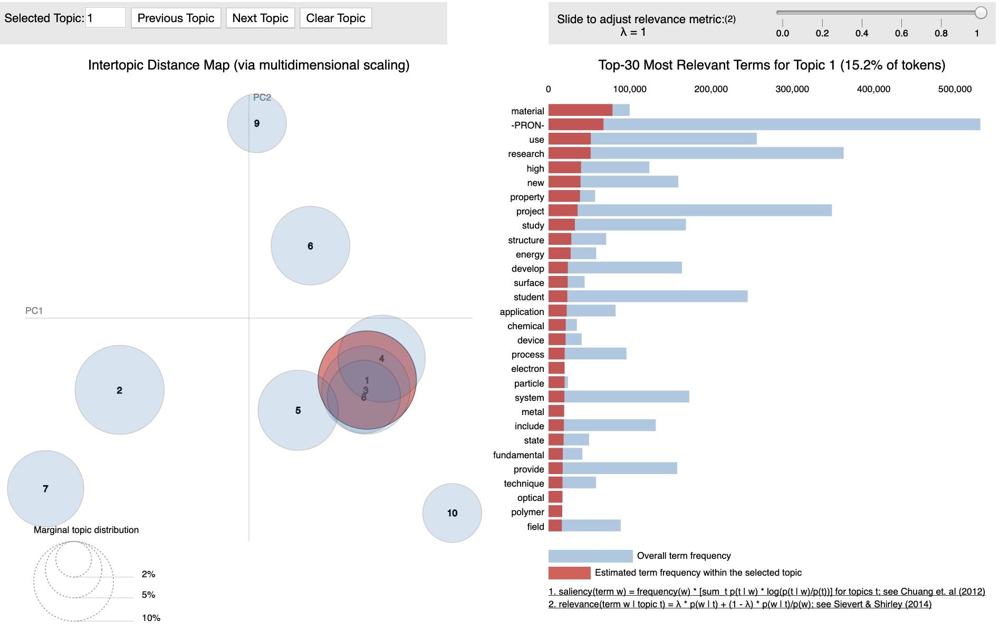

In [27]:
# sample LDA visualization of topic 1
from IPython.core.display import Image, display
display(Image(filename="../reports/figures/ldaVisualizationTopic1.png"))

###### change to code cell when running in interactive mode outside github

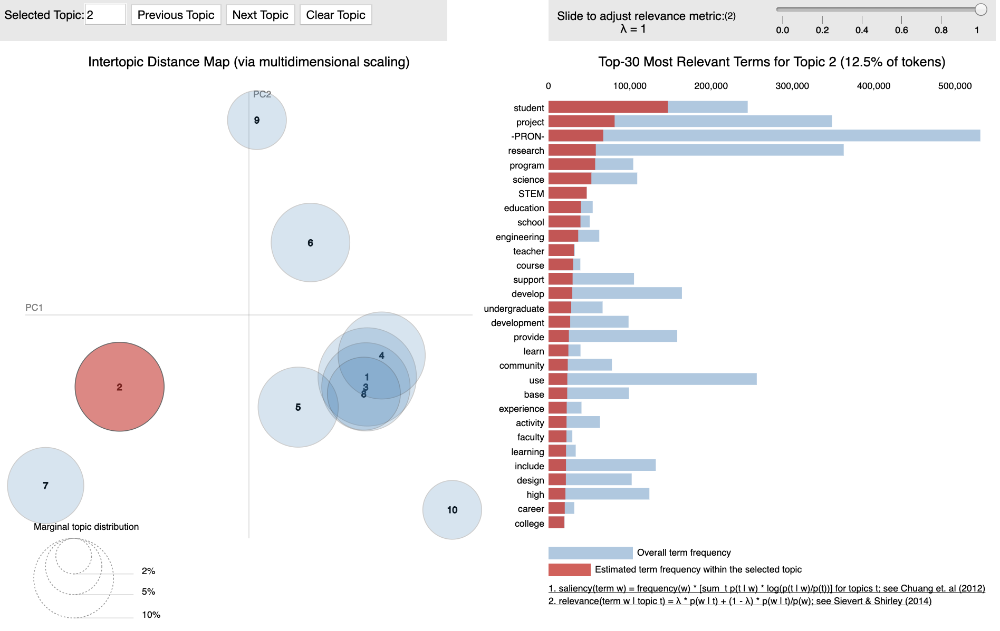

In [28]:
# sample LDA visualization topic 2
from IPython.core.display import Image, display
display(Image(filename="../reports/figures/ldaVisualizationTopic2.png"))

## Predict Topic new abstract

In [72]:
import nltk
def lda_topic_new_doc(original_text, min_topic_freq=0.05):
    """
    accept the original text of a review and (1) parse it with spaCy,
    (2) apply text pre-proccessing steps, (3) create a bag-of-words
    representation, (4) create an LDA representation, and
    (5) print a sorted list of the top topics in the LDA representation
    """
    
    # parse the review text with spaCy
    def rm_punc(txt):
        return txt.is_punct or txt.is_space
    
    tokens = nlp(original_text, disable = ['ner', 'parser'])
    lemmas = [txt.lemma_ for txt in tokens if not rm_punc(txt)]
    stopwords_spacy = spacy.lang.en.stop_words.STOP_WORDS
    stopwords = set(nltk.corpus.stopwords.words('english')+list(stopwords_spacy))
    nlp_abstract = [lemma for lemma in lemmas if lemma not in stopwords] 
    
    # create a bag-of-words representation
    abstract_bow = dictionary.doc2bow(nlp_abstract)
    
    # create an LDA representation
    abstract_lda = lda[abstract_bow]
    
    # sort with the most highly related topics first
    #review_lda = sorted(review_lda, key=lambda (topic_number, freq): -freq)
    main_theme = sorted(lda.get_document_topics(abstract_bow), key=itemgetter(1), reverse=True)[0]
   
    print(main_theme)
    print('words associated with this topic:\n',lda.print_topic(main_theme[0]))

In [73]:
snf.to_csv(data_path /'snf.csv', index_label='AwardID', index=True)

In [74]:
lda_topic_new_doc('scientific study')

(1, 0.36774537)
words associated with this topic:
 0.024*"-PRON-" + 0.023*"theory" + 0.015*"problem" + 0.014*"study" + 0.010*"project" + 0.009*"equation" + 0.008*"geometry" + 0.008*"space" + 0.008*"mathematical" + 0.007*"system"


# Predicting Award Funding

<p>After obtaining attributes from the text analysis, the data was ready to build the model to predict the amount of funding based on text patterns using Extreme Gradient Boosting (XGBoost).</p>

<p>The goal of XGBoosting is to train multiple models and sequentially combine them to improve predictive accuracy until the there is no more 'relevant' improvement and 'errors' has been minimized to the possible extend.</p>

<p>A quick refresher of the target of the distribution of the target variable, 'AwardAmount' shows the data is still skewed and a log transformed could improve predictive results.</p>

<p>Since a new attribute <b>'award_amount_per_day'</b> was created base on the award duration, two separate models will be created using <b>'AwardAmount'</b> and '<b>'award_amount_per_day'</b> as target variables.</p>


In [75]:
# set filterwarnings to 'once' to show warnings only the first time code is run
import warnings
warnings.filterwarnings('ignore') # show warnings only the first time code is run

In [76]:
# import modules
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# set wider prints for pandas
pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows', 500)

# set displaying options for pandas
pd.options.display.max_colwidth = 200
pd.options.display.float_format = '{:.2f}'.format

# set displaying options for plots with sns and plt
_=plt.rcParams['figure.figsize'] = [14,6]
_=plt.style.use(['fivethirtyeight'])
#_=plt.grid(b=None)
_=plt.rcParams['xtick.labelsize']=15
_=plt.rcParams['ytick.labelsize']=15
_=sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
_=sns.set_style(style = 'dark')

# 'double resolution plot output for Retina screens'
%config InlineBackend.figure_format = 'retina'

In [77]:
from pathlib import Path
# set path to save and retrieve data
data_path = Path("../data/")
img_path = Path("../report/images/")

In [78]:
%%time
with open(data_path / 'snf.csv') as f:
    snf= pd.read_csv(f)
print('\nThere are', '{:,}'.format(snf.shape[0]), 'grant abstracts in the dataset\n')


There are 164,243 grant abstracts in the dataset

CPU times: user 9.87 s, sys: 1.25 s, total: 11.1 s
Wall time: 11.3 s


### Revisiting the distribution of the award amount

Since the distribution of both target variables is skewed, the models will be trained using a log10 transformed on the the target variable.

#### Total Award Amount

In [79]:
snf['AwardAmount'].describe()

count      164243.00
mean       444803.48
std       2282003.08
min           579.00
25%        100000.00
50%        245453.00
75%        426354.50
max     277145487.00
Name: AwardAmount, dtype: float64

## Comparing models

Since there are several outliers in the data, two different models were created using the daily award amount. The first model was created using the a log10 transform and the second model was done taking only proposals with up to 5 years of duration.

In [80]:
# import modules
import xgboost as xgb
from sklearn.metrics import mean_squared_error
#from numpy import loadtxt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

### Target: Award amount per day (log)

In [81]:
snf['main_topic'] = snf['main_topic'].astype('category')

In [82]:
df = pd.concat([snf,pd.get_dummies(snf[['predGender_po','main_topic']], 
                                   prefix=['is','topic'],
                                   drop_first=False)] ,axis=1)
df.reset_index(inplace=True)

In [83]:
print(df.columns.tolist(), end=',')

['index', 'AwardID', 'AbstractNarration', 'AwardAmount', 'AwardEffectiveDate', 'AwardExpirationDate', 'AwardTitle', 'CityName', 'CountryName', 'Institution', 'NSF_org', 'LongName.1', 'Name', 'SignBlockName', 'StateCode', 'StateName', 'Value', 'ZipCode', 'year', 'grant_duration', 'amount_awarded_per_day', 'clean_abstract', 'flesch_score', 'sentence_count', 'word_count', 'avg_word_len', 'unique_words', 'avg_words_per_sent', 'lexical_diversity', 'abstract_length', 'predGender_po', 'adverb_count', 'nlp_abstract', 'main_topic', 'theme_prob', 'is_female', 'is_male', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9'],

In [84]:
# select attributes to use in the model
df = df[['amount_awarded_per_day','grant_duration','flesch_score',
       'sentence_count', 'word_count', 'avg_word_len', 'unique_words',
       'avg_words_per_sent', 'lexical_diversity',
       'adverb_count', 'is_female', 'is_male', 
         'topic_0', 'topic_1', 'topic_2', 'topic_3', 
         'topic_4', 'topic_5', 'topic_6', 'topic_7', 
         'topic_8', 'topic_9']]

In [85]:
# log transform target variable
df['amount_awarded_per_day'] = np.log10(df['amount_awarded_per_day'])

In [86]:
# separate the predictors from the target variable
X, y = df.iloc[:,1:], df.iloc[:,0]

In [87]:
# confirm the target variable was chosen
y.head(1)

0   2.68
Name: amount_awarded_per_day, dtype: float64

In [88]:
# data matrix tto use in Gboost
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [89]:
# split data into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=44)

#### Tuning the model
XGBoost provides several tuning parameters. The following are used for the models in this analysis:  
<ul>
    <li>The objective, lets the model know this is a regression problem and not a classification model.</li>
    <li>colsample_bytree is the proportion of features that each tree in the ensemble model will use.</li>
    <li>learning_rate is used in step size shrinkage to prevents overfitting. </li>
    <li>max depth is the maximum depth of the tree, also use to prevent overfitting</li>
    <li>alpha is the L1 regularization.</li>
    <li>n_estimators tell the model how many trees to build.</li>
</ul>

In [90]:
# initialize the model
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', 
                          colsample_bytree = 0.5, 
                          learning_rate = 0.07,
                          max_depth = 3,            
                          alpha = 5, 
                          n_estimators = 1000) # for half the topics

In [91]:
# fit the model on the trainig set
xg_reg.fit(X_train,y_train)

XGBRegressor(alpha=5, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.5, gamma=0,
             importance_type='gain', learning_rate=0.07, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

In [92]:
# fit the model on the trainig set
xg_reg.fit(X_train,y_train)

XGBRegressor(alpha=5, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.5, gamma=0,
             importance_type='gain', learning_rate=0.07, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

In [93]:
# make predictions on the test set
preds = xg_reg.predict(X_test)

In [94]:
# Evaluate the performance of the model using RMSE
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))
print("\nThe model is able to predict the award amount \
of every abstract in the test set within $%f of the award amount per day."% 10**(rmse))

RMSE: 0.379289

The model is able to predict the award amount of every abstract in the test set within $2.394907 of the award amount per day.


In [95]:
# chaning parameters
params = {"objective":"reg:squarederror",
          'colsample_bytree':0.5,
                 'gamma':0,                 
                 'learning_rate':0.2,
                 'max_depth':5,
                 'min_child_weight':1.5,
                 'n_estimators':1000}

In [96]:
cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=5,
                    num_boost_round=50,early_stopping_rounds=10,
                    metrics="rmse", as_pandas=True, seed=88)

In [97]:
cv_results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,1.48,0.00,1.48,0.00
1,1.21,0.00,1.21,0.00
2,1.00,0.00,1.00,0.00
3,0.83,0.00,0.83,0.00
4,0.71,0.00,0.71,0.00


In [98]:
cv_results["test-rmse-mean"].tail(1)

49   0.38
Name: test-rmse-mean, dtype: float64

In [99]:
xg_reg = xgb.train(params=params, dtrain=data_dmatrix, num_boost_round=20)

### Feature importance

The model predicts that everything else held constant, grant duration is the most important factor in predicting award amounts, followed by the number of word and unique words used. The number shows how many times the variable was split.

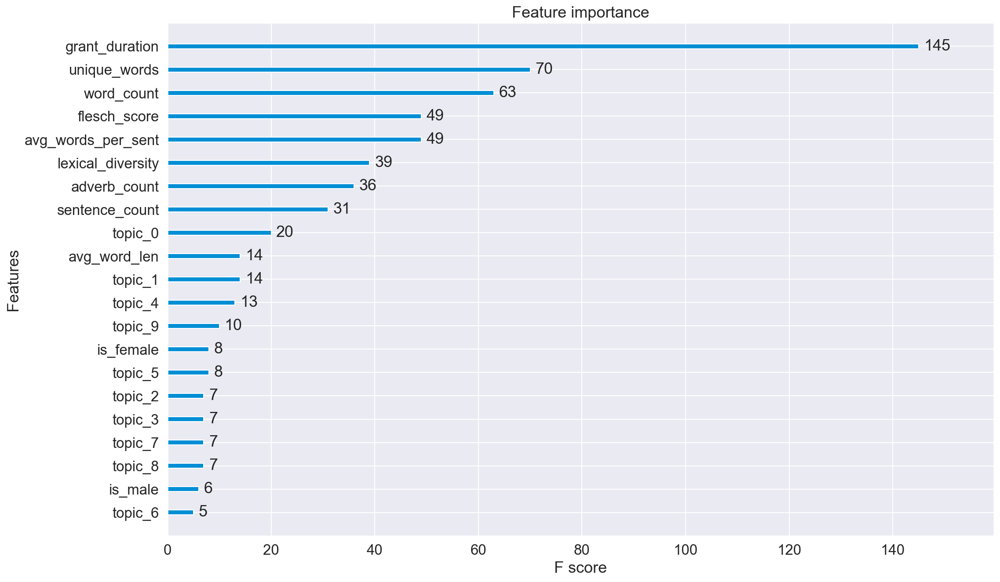

In [100]:
_=plt.rcParams['figure.figsize'] = [15, 10]
_=xgb.plot_importance(xg_reg)

Across all models, grant duration was found to be the most important feature in predicting award amounts. The plot below shows a nearly linear relation between the number of days a grant last and the amount received.

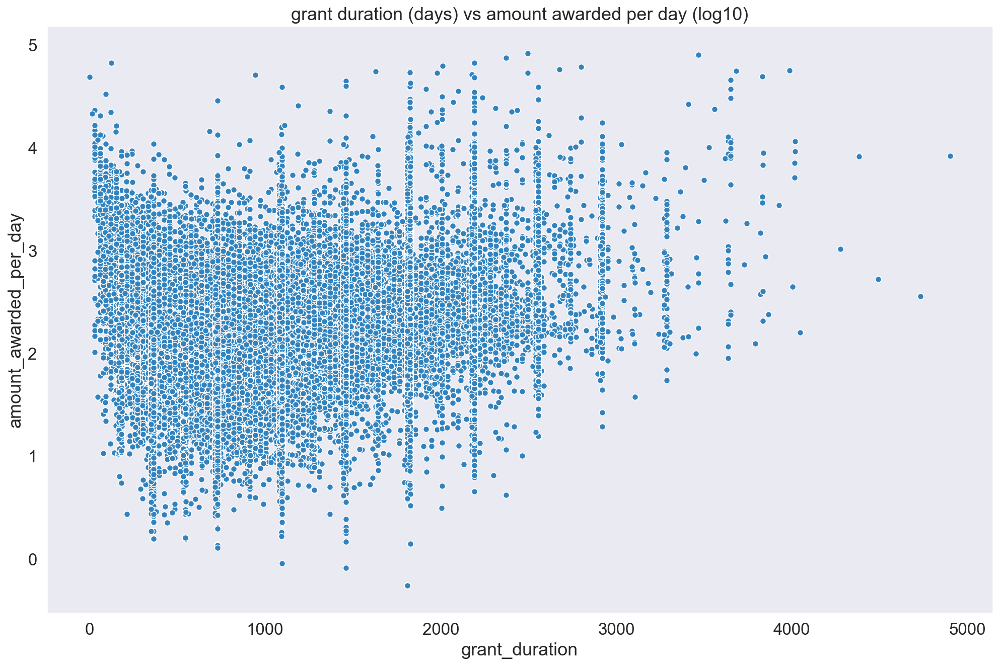

In [101]:
_=plt.title("grant duration (days) vs amount awarded per day (log10)")
plot_scatter(x= 'grant_duration', 
             y ='amount_awarded_per_day', 
             data = df, 
             title = 'grant duration vs amount awarded per day (log10)', 
             xlabel="grand duration in days (log10)", 
             ylabel="amount awarded per day", 
             prefix='featureImportanceDuration', 
             scale = None, color = '#d95f0e')

The number of unique words used also was found to be a good predictors. Abstracts that states their purpose clearly without repeating the same information tend to be awarded more funding.

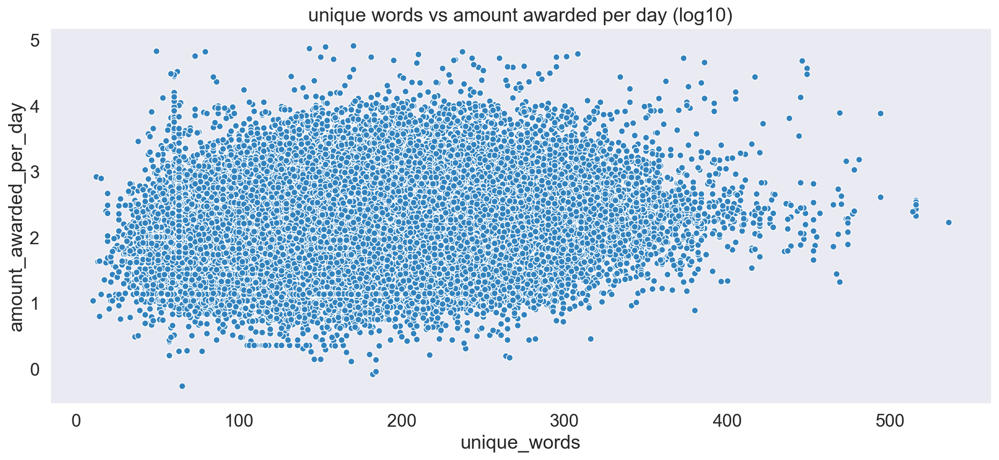

In [102]:
_=plt.title("unique words vs amount awarded per day (log10)")
plot_scatter(x= 'unique_words', 
             y ='amount_awarded_per_day', 
             data = df, 
             title = 'grant duration vs amount awarded per day (log10)', 
             xlabel="unique words per abstract", 
             ylabel="amount awarded per day (log10)", 
             prefix='featureImportanceUniqueWords', 
             scale = None)

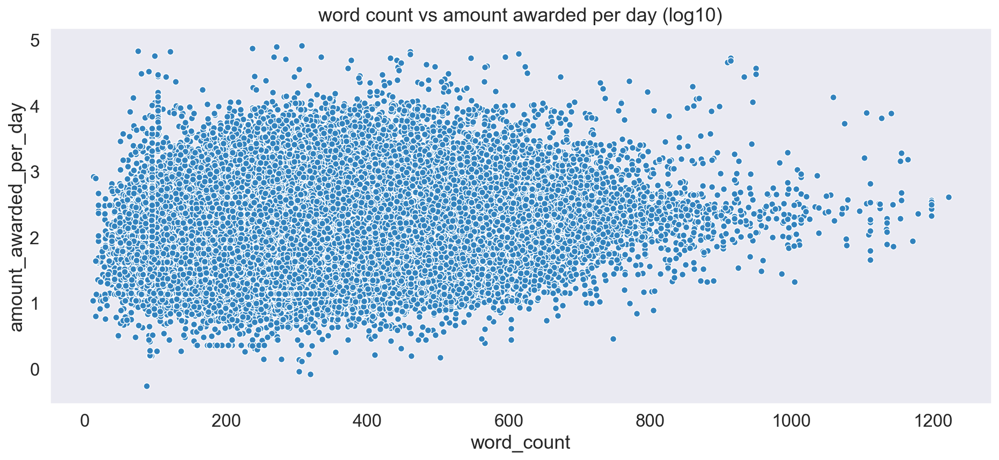

In [103]:
_=plt.title("word count vs amount awarded per day (log10)")
plot_scatter(x= 'word_count', 
             y ='amount_awarded_per_day', 
             data = df, 
             title = 'grant duration vs amount awarded per day (log10)', 
             xlabel="words count per abstract", 
             ylabel="amount awarded per day (log10)", 
             prefix='featureImportanceWordCount', 
             scale = None)


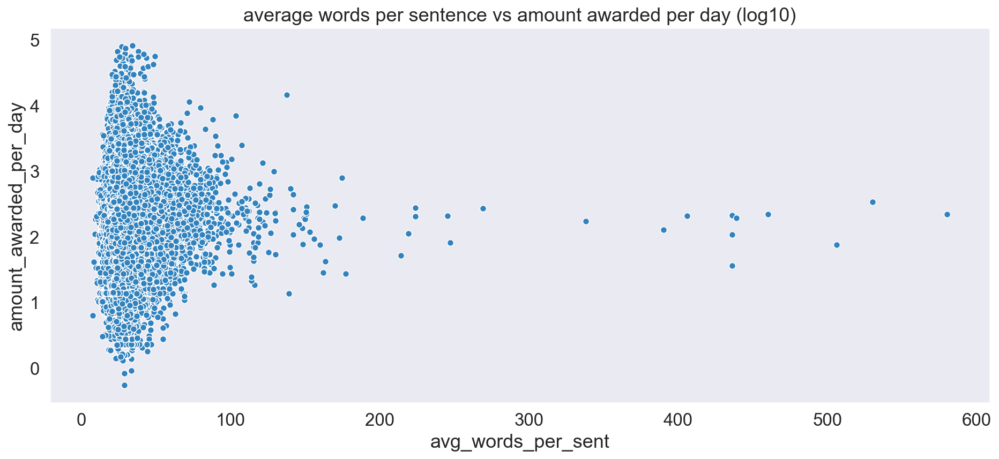

In [104]:
_=plt.title("average words per sentence vs amount awarded per day (log10)")
plot_scatter(x= 'avg_words_per_sent', 
             y ='amount_awarded_per_day', 
             data = df, 
             title = 'grant duration vs amount awarded per day (log10)', 
             xlabel="grand duration in days", 
             ylabel="amount awarded per day", 
             prefix='featureImportanceAvgWordsSent', 
             scale = None)

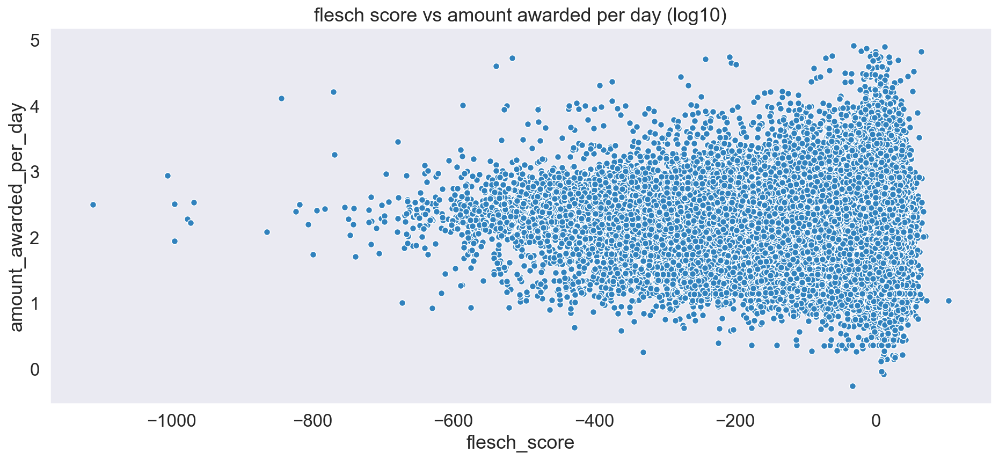

In [105]:
_=plt.title("flesch score vs amount awarded per day (log10)")
plot_scatter(x= 'flesch_score', 
             y ='amount_awarded_per_day', 
             data = df, 
             title = 'flesch vs amount awarded per day (log10)', 
             xlabel="grand duration in days", 
             ylabel="amount awarded per day(log10)", 
             prefix='featureImportanceFleschScore', 
             scale = None)

## ****** ********* ******** ****** ******

### Train a model using the amount awarded per day with no transformation

<p>As previously mentioned, the model was trained on two different target variables, award amount and per day award amount. Then each target was used both log10 transformed and untransformed to compare results.</p>

<p>Below are the results of the model trained on per day award amount without log transformed.</p>

In [106]:
# create dummy variables
daily = pd.concat([snf,pd.get_dummies(snf[['predGender_po','main_topic']], 
                                   prefix=['is','topic'],
                                   drop_first=False)] ,axis=1)

In [107]:
# reset index
daily.reset_index(inplace=True)

In [108]:
# print column names
print(df.columns.tolist(), end=',')

['amount_awarded_per_day', 'grant_duration', 'flesch_score', 'sentence_count', 'word_count', 'avg_word_len', 'unique_words', 'avg_words_per_sent', 'lexical_diversity', 'adverb_count', 'is_female', 'is_male', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9'],

In [109]:
# select only features to be used in the model
daily = daily[['amount_awarded_per_day','grant_duration','flesch_score',
       'sentence_count', 'word_count', 'avg_word_len', 'unique_words',
       'avg_words_per_sent', 'lexical_diversity',
       'adverb_count', 'is_female', 'is_male', 
         'topic_0', 'topic_1', 'topic_2', 'topic_3', 
         'topic_4', 'topic_5', 'topic_6', 'topic_7', 
         'topic_8', 'topic_9']]

In [110]:
# separate target from predictors
X, y = daily.iloc[:,1:], daily.iloc[:,0]

In [111]:
# create xgbooost matrix
daily_matrix = xgb.DMatrix(data=X,label=y)

In [112]:
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=44)

In [113]:
daily_reg = xgb.XGBRegressor(objective ='reg:squarederror', 
                          colsample_bytree = 0.5, 
                          learning_rate = 0.07,
                          max_depth = 3,            
                          alpha = 5, 
                          n_estimators = 1000) # for half the topics

In [114]:
# fit the model
daily_reg.fit(X_train,y_train)

XGBRegressor(alpha=5, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.5, gamma=0,
             importance_type='gain', learning_rate=0.07, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

In [115]:
# predict on unseen data
daily_pred = daily_reg.predict(X_test)

In [116]:
# RMSE
daily_rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %2f" % (daily_rmse))

RMSE: 1069.447126


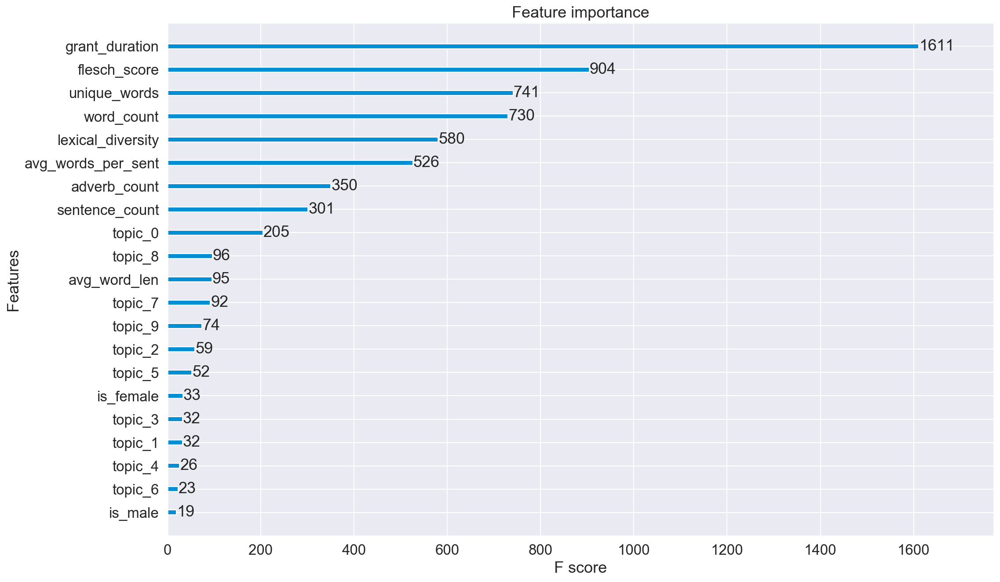

In [117]:
# plot the feature importance.
_=plt.rcParams['figure.figsize'] = [15, 10]
_=xgb.plot_importance(daily_reg)

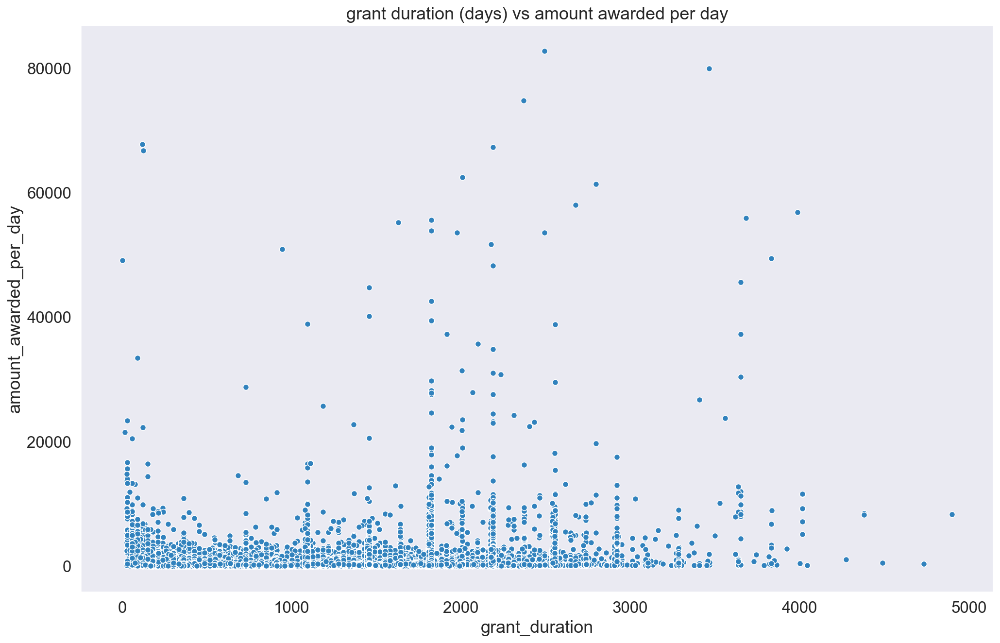

In [118]:
_=plt.title("grant duration (days) vs amount awarded per day")
plot_scatter(x= 'grant_duration', 
             y ='amount_awarded_per_day', 
             data = daily, 
             title = 'grant duration vs amount awarded per day', 
             xlabel="grand duration in days", 
             ylabel="amount awarded per day", 
             prefix='featureImportanceDuration', 
             scale = None, color = '#d95f0e')

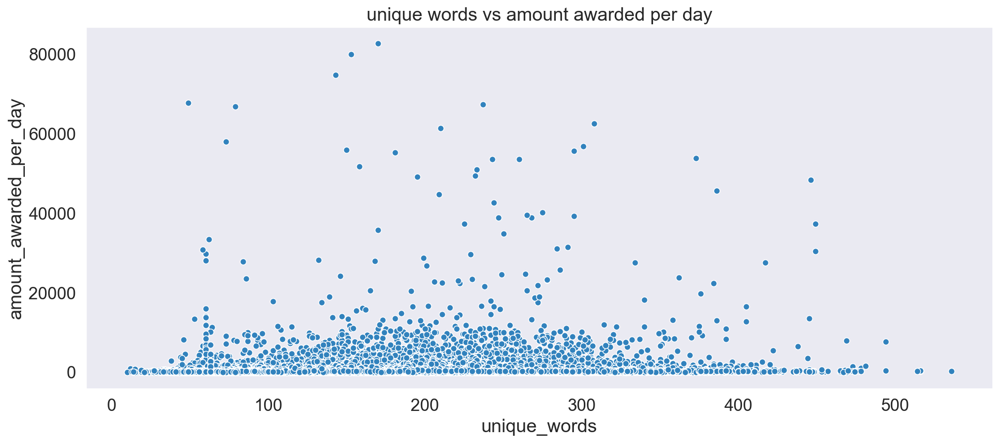

In [119]:
_=plt.title("unique words vs amount awarded per day")
plot_scatter(x= 'unique_words', 
             y ='amount_awarded_per_day', 
             data = daily, 
             title = 'grant duration vs amount awarded per day', 
             xlabel="unique words per abstract", 
             ylabel="amount awarded per day", 
             prefix='featureImportanceUniqueWords', 
             scale = None)

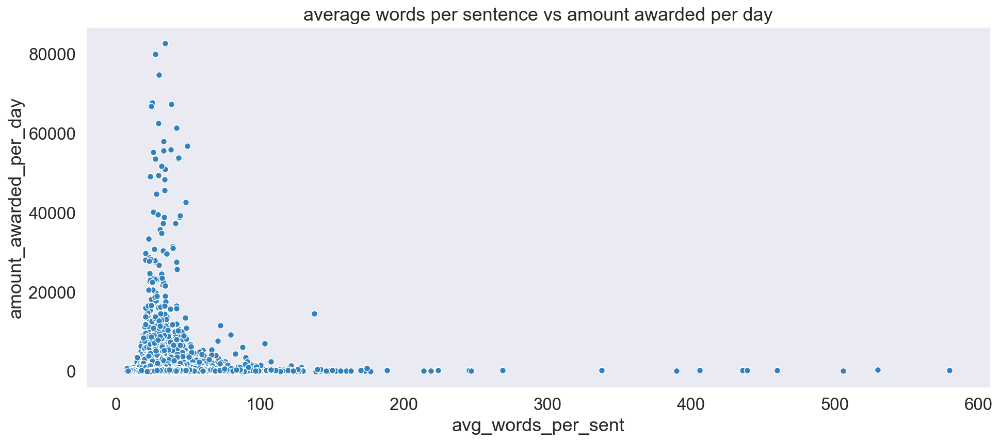

In [120]:
_=plt.title("average words per sentence vs amount awarded per day")
plot_scatter(x= 'avg_words_per_sent', 
             y ='amount_awarded_per_day', 
             data = daily, 
             title = 'grant duration vs amount awarded per day', 
             xlabel="grand duration in days", 
             ylabel="amount awarded per day", 
             prefix='featureImportanceAvgWordsSent', 
             scale = None)

## ****** ********* ******** ****** ******

### Predicting total amount

A second model was built using the total Award amount (log transformed) as the target variable. The model predicts that grant duration is the most important feature when predicting the aid received. The number of unique words was also an important feature. As the number of unique words increases, the award amount tends to increase as well.

In [121]:
# concat the dummy variables for gender and main topic with the main deata set
df_aa = pd.concat([snf,pd.get_dummies(snf[['predGender_po','main_topic']], 
                                   prefix=['is','topic'],
                                   drop_first=False)] ,axis=1)

In [122]:
# reset index
df_aa.reset_index(inplace=True)

In [123]:
print(df_aa.columns.tolist(), end=',')

['index', 'AwardID', 'AbstractNarration', 'AwardAmount', 'AwardEffectiveDate', 'AwardExpirationDate', 'AwardTitle', 'CityName', 'CountryName', 'Institution', 'NSF_org', 'LongName.1', 'Name', 'SignBlockName', 'StateCode', 'StateName', 'Value', 'ZipCode', 'year', 'grant_duration', 'amount_awarded_per_day', 'clean_abstract', 'flesch_score', 'sentence_count', 'word_count', 'avg_word_len', 'unique_words', 'avg_words_per_sent', 'lexical_diversity', 'abstract_length', 'predGender_po', 'adverb_count', 'nlp_abstract', 'main_topic', 'theme_prob', 'is_female', 'is_male', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9'],

In [124]:
#log transformed target variable.
df_aa['AwardAmount'] = np.log10(df_aa['AwardAmount'])

In [125]:
# prepare dataset for modeling
df_aa = df_aa[['AwardAmount','grant_duration','flesch_score',
       'sentence_count', 'word_count', 'avg_word_len', 'unique_words',
       'avg_words_per_sent', 'lexical_diversity',
       'adverb_count', 'is_female', 'is_male', 
         'topic_0', 'topic_1', 'topic_2', 'topic_3', 
         'topic_4', 'topic_5', 'topic_6', 'topic_7', 
         'topic_8', 'topic_9']]

In [126]:
# separate target variable from predictors
X, y = df_aa.iloc[:,1:], df_aa.iloc[:,0]

In [127]:
# confirm target variable was selected
y.head(1)

0   5.85
Name: AwardAmount, dtype: float64

In [128]:
# create xgboost matrix
AAdmatrix = xgb.DMatrix(data=X,label=y)

In [129]:
# split into training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=44)

In [130]:
# initialize model and set tuning parameters
xg_regAA = xgb.XGBRegressor(objective ='reg:squarederror', 
                          colsample_bytree = 0.3, 
                          learning_rate = 0.2,
                          max_depth = 3,            
                          alpha = 5, 
                          n_estimators = 1000) # for half the topics

In [131]:
# train the model
xg_regAA.fit(X_train,y_train)

XGBRegressor(alpha=5, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.3, gamma=0,
             importance_type='gain', learning_rate=0.2, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

In [132]:
# test on unseen data
predAA = xg_regAA.predict(X_test)

In [133]:
#RMES
rmse_AA = np.sqrt(mean_squared_error(y_test, predAA))
print("RMSE: %f" % (rmse_AA))

RMSE: 0.379137


In [134]:
params = {"objective":"reg:squarederror",
          'colsample_bytree':0.5,
                 'gamma':0,                 
                 'learning_rate':0.07,
                 'max_depth':3,
                 'min_child_weight':1.5,
                 'n_estimators':100,                                                                    
                 'reg_alpha':0.75,
                 'reg_lambda':0.45}

In [135]:
cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=5,
                    num_boost_round=50,early_stopping_rounds=10,
                    metrics="rmse", as_pandas=True, seed=88)

In [136]:
xg_regAA = xgb.train(params=params, dtrain=AAdmatrix, num_boost_round=20)

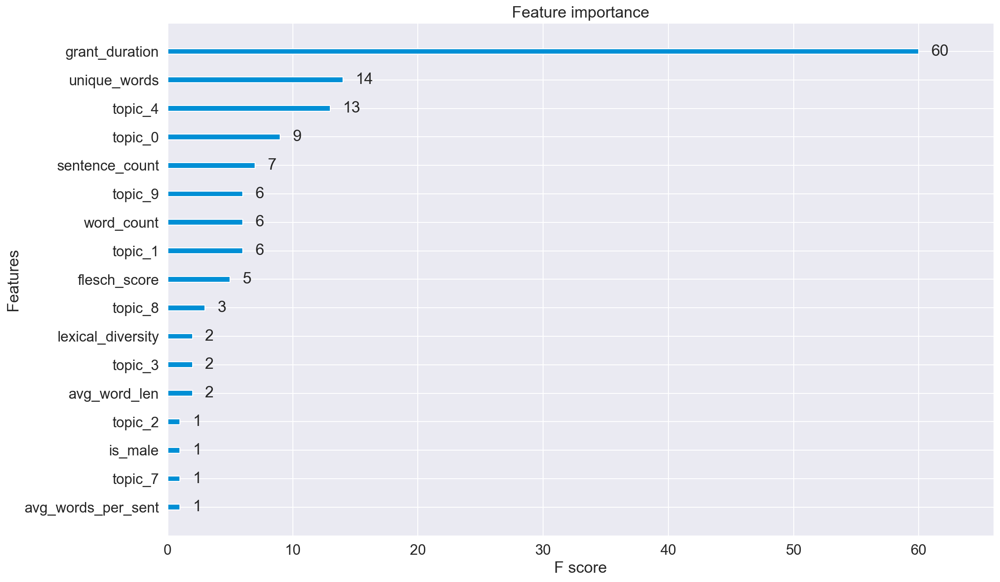

In [137]:
# feature importance in predicting the award amount
_=plt.rcParams['figure.figsize'] = [15, 10]
_=xgb.plot_importance(xg_regAA)

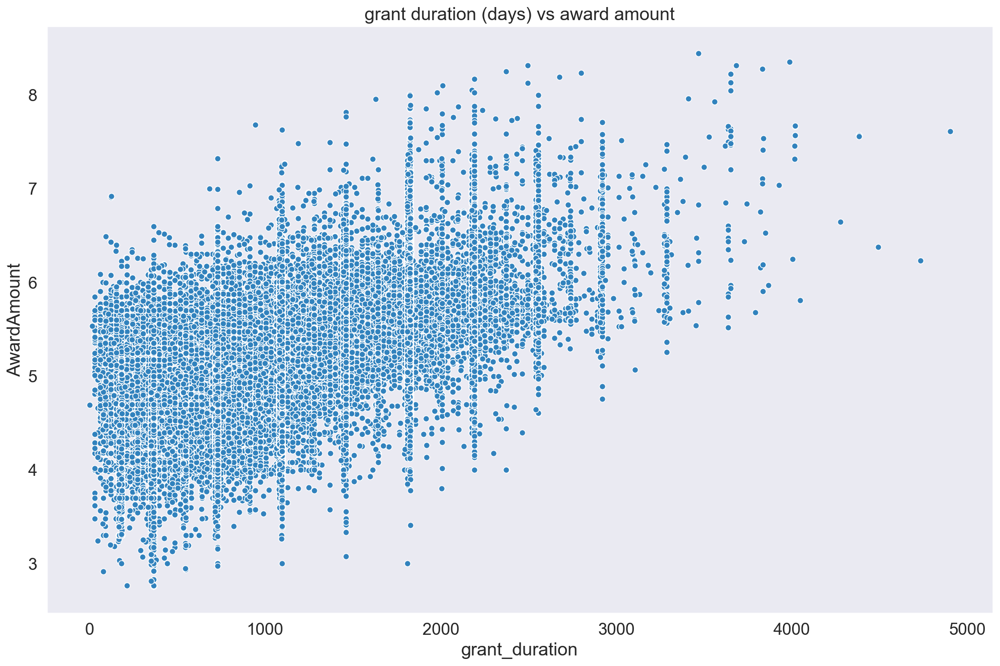

In [138]:
_=plt.title("grant duration (days) vs award amount")
plot_scatter(x= 'grant_duration', 
             y ='AwardAmount', 
             data = df_aa, 
             title = 'grant duration vs amount awarded per day', 
             xlabel="grand duration in days", 
             ylabel="amount awarded", 
             prefix='featureImportanceDuration', 
             scale = None, color = '#d95f0e')

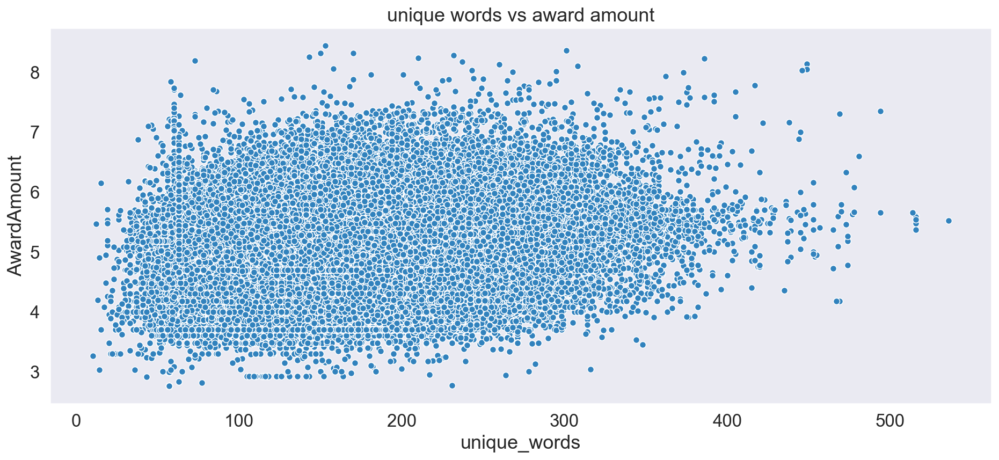

In [139]:
_=plt.title("unique words vs award amount")
plot_scatter(x= 'unique_words', 
             y ='AwardAmount', 
             data = df_aa, 
             title = 'unique words vs amount awarded per day', 
             xlabel="grand duration in days", 
             ylabel="amount awarded", 
             prefix='featureImportanceUniqueWords', 
             scale = None, color = '#d95f0e')

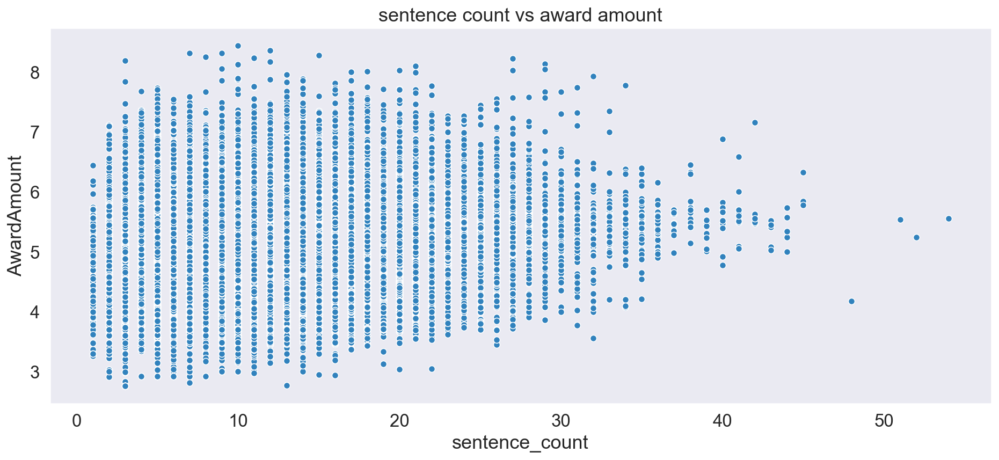

In [140]:
_=plt.title("sentence count vs award amount")
plot_scatter(x= 'sentence_count', 
             y ='AwardAmount', 
             data = df_aa, 
             title = 'sentence count vs amount awarded per day', 
             xlabel="sentence count", 
             ylabel="amount awarded", 
             prefix='featureImportanceSentenceCount', 
             scale = None, color = '#d95f0e')

### Linear Regression Award amount per day

<p>A linear regression was also tried to compare the accuracy with the XGbooost model. However, the accuracy of the model on unseen data was very low. With everything else constant, the model only explained 20% of the variability in award amount.</p>

In [141]:
df_ln = pd.concat([snf,pd.get_dummies(snf[['predGender_po','main_topic']], 
                                   prefix=['is','topic'],
                                   drop_first=False)] ,axis=1)

In [142]:
df_ln.reset_index(inplace=True)

In [143]:
print(df_ln.columns.tolist(), end=',')

['index', 'AwardID', 'AbstractNarration', 'AwardAmount', 'AwardEffectiveDate', 'AwardExpirationDate', 'AwardTitle', 'CityName', 'CountryName', 'Institution', 'NSF_org', 'LongName.1', 'Name', 'SignBlockName', 'StateCode', 'StateName', 'Value', 'ZipCode', 'year', 'grant_duration', 'amount_awarded_per_day', 'clean_abstract', 'flesch_score', 'sentence_count', 'word_count', 'avg_word_len', 'unique_words', 'avg_words_per_sent', 'lexical_diversity', 'abstract_length', 'predGender_po', 'adverb_count', 'nlp_abstract', 'main_topic', 'theme_prob', 'is_female', 'is_male', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9'],

In [144]:
df_ln['amount_awarded_per_day'] = np.log10(df_ln['amount_awarded_per_day'])

In [145]:
df_ln = df_ln[['amount_awarded_per_day','grant_duration','flesch_score',
       'sentence_count', 'word_count', 'avg_word_len', 'unique_words',
       'avg_words_per_sent', 'lexical_diversity',
       'adverb_count', 'is_female', 'is_male', 
         'topic_0', 'topic_1', 'topic_2', 'topic_3', 
         'topic_4', 'topic_5', 'topic_6', 'topic_7', 
         'topic_8', 'topic_9']]

In [146]:
X, y = df_ln.iloc[:,1:], df_ln.iloc[:,0]

In [147]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=88)

In [148]:
from sklearn.linear_model import LinearRegression

regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [149]:
y_pred = regressor.predict(X_test)
print('Linear Regression R squared": %.2f' % regressor.score(X_test, y_test))

Linear Regression R squared": 0.21


## Conclusions

<p>The previous analysis used data on projects funded by the NSF to conduct text analysis, topic modeling and create a predictive model to help identify whether language structure and project topic have an impact on the amount of money projects receive.</p>

<p>Since the hypothesis was that language patterns and abstract length had an impact on funding, feature engineering through text extraction was a key component to the analysis. The derived features, including gender of the program officer who approved the award, word count, unique word count, lexical complexity, grant duration, sentence count, average words per sentence, flesch ease read score and topic of the abstract provided relevant information to build the XGBoost models.</p>

<p>The results all the model used including gender classification, topic modeling and award amount prediction can be used not only to review project proposals submitted for NSF funding, but other U.S. government financial request.</p>

## Further Analysis

<p>Other features such as geographic location and name of the author or team who submitted the proposal could be used in further analysis to understand how research funding has been allocated throughout the U.S. over the years. Unfortunately for this analysis the geographic location attribute have a large number of missing values and there was no consistency in recording the name or institution of the author(s) of the proposal.</p>

<p>Additional feature engineering and different tuning parameters could also provide more relevant variables that can help predict the impact of language patterns in funding received.</p>